##importing libriries

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
import xgboost as xgb
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
import numpy as np
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split



##Reading data_frame

In [ ]:
df = pd.read_csv("/content/train.csv")
df.head(3)

,id,request_date,pickup_city,destination_city,accepted_date,started_date,rider,driver,trip_distance,driver2rider_distance,used_discount,trip_status,trip_finished_date,rider_rating,driver_rating,rider_cancel_reason,driver_cancel_reason,discount_amount,trip_fee
0,LVwq2xeA5mMt,2021-01-30 14:06:19.94,Constantine,Constantine,2021-01-30 14:07:04.707,NaN,E1B3rg1jOiBF,DVwusPupJeU4,16035.0,1927.0,0.0,NOT_FINISHED,NaN,NaN,NaN,NaN,NaN,NaN,511.0
1,U9CuIIRyArx0,2021-05-18 07:54:39.922,Alger,Alger,2021-05-18 07:55:05.362,2021-05-18 08:03:23.664,u7zilHWibXpk,Mv2dXvQt5e5i,12031.0,1884.0,0.0,FINISHED,2021-05-18 08:32:03.611,4.0,5.0,NaN,NaN,NaN,579.0
2,ke1gwcPZ93Nl,2021-03-05 13:17:24.999,Oran,Oran,NaN,NaN,NmumknIUfHYy,yOf6NbYVTVAl,16812.0,994.0,0.0,NOT_FINISHED,NaN,NaN,NaN,NaN,NaN,NaN,706.0


In [ ]:
df.info()
#df.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 533518 entries, 0 to 533517
Data columns (total 19 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   id                     533518 non-null  object 
 1   request_date           533518 non-null  object 
 2   pickup_city            533517 non-null  object 
 3   destination_city       533517 non-null  object 
 4   accepted_date          357594 non-null  object 
 5   started_date           244985 non-null  object 
 6   rider                  533517 non-null  object 
 7   driver                 533517 non-null  object 
 8   trip_distance          533517 non-null  float64
 9   driver2rider_distance  533517 non-null  float64
 10  used_discount          533517 non-null  float64
 11  trip_status            533517 non-null  object 
 12  trip_finished_date     247344 non-null  object 
 13  rider_rating           239378 non-null  float64
 14  driver_rating          243753 non-nu

In [ ]:
df.isnull().sum()

id                            0
request_date                  0
pickup_city                   1
destination_city              1
accepted_date            175924
started_date             288533
rider                         1
driver                        1
trip_distance                 1
driver2rider_distance         1
used_discount                 1
trip_status                   1
trip_finished_date       286174
rider_rating             294140
driver_rating            289765
rider_cancel_reason      526104
driver_cancel_reason     526104
discount_amount          495597
trip_fee                      1
dtype: int64

##Time series handling

In [ ]:
#replace by mean :

#df["started_date"].fillna(df["started_date"].mean() ,inplace=True )
#df["trip_finished_date"].fillna(df["trip_finished_date"].mean() , inplace=True)

#Drop
#df.dropna(subset=['accepted_date', 'trip_finished_date'], inplace=True)

#fill nan finished with zero


#df["trip_finished_date"] = df["trip_finished_date"].fillna(0)


In [ ]:
#Time-series-transformation :
finish_date = pd.to_datetime(df["trip_finished_date"], format="%Y-%m-%d %H:%M:%S")
#started_date = pd.to_datetime(df["started_date"], format="%Y-%m-%d %H:%M:%S")
accepted_date = pd.to_datetime(df["accepted_date"], format="%Y-%m-%d %H:%M:%S")
duration = finish_date - accepted_date
time_day = accepted_date.dt.hour
#jour de la semaine
day_week = finish_date.dt.dayofweek

In [ ]:
duration_frame = duration.to_frame()
time_day_frame= time_day.to_frame() ###not yet
day_week_frame = day_week.to_frame()

In [ ]:
#df.columns
#df[0].rename("duration" , inplace=True)


df["duration"]=duration_frame
df["day_week"] = day_week_frame
df["time_day"] = time_day_frame


df["duration"] = df["duration"].dropna
df["day_week"] = df["day_week"].dropna
df["time_day"] = df["time_day"].dropna



##status_trip

##Fonction des TS for le test df

In [ ]:
#test_data["trip_finished_date"] = test_data["trip_finished_date"].fillna(0)


In [ ]:
#Time-series-transformation :
finish_date_test = pd.to_datetime(test_data["trip_finished_date"], format="%Y-%m-%d %H:%M:%S")
#started_date = pd.to_datetime(df["started_date"], format="%Y-%m-%d %H:%M:%S")
accepted_date_test = pd.to_datetime(test_data["accepted_date"], format="%Y-%m-%d %H:%M:%S")
duration_date_test = finish_date_test - accepted_date_test
time_day_test = accepted_date_test.dt.hour
#jour de la semaine
day_week_test = finish_date_test.dt.dayofweek

In [ ]:
duration_frame_test = duration_date_test.to_frame()
time_day_frame_test= time_day_test.to_frame()
day_week_frame_test = day_week_test.to_frame()


In [ ]:
#df.columns
#df[0].rename("duration" , inplace=True)



test_data["duration"]=duration_frame_test
test_data["day_week"] = day_week_frame_test
test_data["time_day"] = time_day_frame_test



In [ ]:
test_data["duration"] = test_data["duration"].dropna
test_data["day_week"] = test_data["day_week"].dropna
test_data["time_day"] = test_data["time_day"].dropna


##boxplot

In [ ]:
boxplot = df.boxplot(column=['trip_distance', 'driver2rider_distance', 'trip_fee'])
# Outlier Detection using IQR
Q1 = df['trip_distance'].quantile(0.25)
Q3 = df['trip_distance'].quantile(0.75)
IQR = Q3-Q1

NameError: name 'df' is not defined

In [ ]:
df_remove_outliers = df[((df['trip_distance'] >= (Q1-1.5*IQR)) | (df['trip_distance'] <= (Q3+1.5*IQR)))]
boxplot = df_remove_outliers.boxplot(column=['trip_distance', 'driver2rider_distance', 'trip_fee'])


In [ ]:
#df['trip_fee'].describe()
#df['driver2rider_distance'].describe()
#df["trip_distance"].describe()



In [ ]:
df["rider_cancel_reason"].unique()

In [ ]:
ds.isnull().sum()

##Correaltion map

In [ ]:
def plot_correlation_map(df):
    corr = df.corr()
    s , ax = plt.subplots( figsize =( 12 , 10 ) )
    cmap = sns.diverging_palette( 220 , 10 , as_cmap = True )
    s = sns.heatmap(
        corr,
        cmap = cmap,
        square=True,
        cbar_kws={ 'shrink' : .9 },
        ax=ax,
        annot = True,
        annot_kws = { 'fontsize' : 12 }
      )

In [ ]:
#df.corr()

plot_correlation_map(df)
#df.drop("Unnamed: 0", axis=1,inplace= True )

##train,test

###label-encoding

In [ ]:

from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder


In [ ]:
enc= LabelEncoder()

In [ ]:
df["pickup_city"]=enc.fit_transform(df["pickup_city"])
df["destination_city"]=enc.fit_transform(df["destination_city"])
df["duration"] = enc.fit_transform(df["duration"])
df["day_week"] = enc.fit_transform(df["day_week"])
df["time_day"] = enc.fit_transform(df["time_day"])








In [ ]:
#X = df[["driver2rider_distance" , "trip_distance" , "pickup_city" , "destination_city" ,"duration" ]]
#X = df[["driver2rider_distance" , "trip_distance" , "pickup_city" , "destination_city"  ]]
#X = df[["trip_distance" ]]
#X = df[["driver2rider_distance" , "trip_distance" , "pickup_city" , "destination_city" , "duration" , "day_week","time_day" ]]
#X = df[["driver2rider_distance" , "trip_distance" , "pickup_city" , "destination_city" , "duration" ]]
X = df[["trip_distance" , "driver2rider_distance" ]]
#X = df[["trip_distance" ]]
#X = df_fini[["trip_distance" , ""]]
#X = df[["driver2rider_distance" , "trip_distance" ]]

Y = df["trip_fee"]

In [ ]:
#X_test = ds[["driver2rider_distance" , "trip_distance"]]
#Y_test = ds["trip_fee"]

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X,Y , test_size=0.33, random_state=42)


In [ ]:
import pandas as pd

# Supposons que df_map soit un DataFrame Pandas contenant la variable trip_distance

# Calcul des quantiles
quantiles_td = df['trip_distance'].quantile([0.05, 0.95])

# Winsorization pour la variable trip_distance
df['trip_distance'] = df['trip_distance'].clip(lower=quantiles_td.iloc[0], upper=quantiles_td.iloc[1])


###label_encoding test

In [ ]:
test_data["pickup_city"]=enc.fit_transform(test_data["pickup_city"])
test_data["destination_city"]=enc.fit_transform(test_data["destination_city"])
test_data["duration"] = enc.fit_transform(test_data["duration"])
test_data["day_week"] = enc.fit_transform(test_data["day_week"])
test_data["time_day"] = enc.fit_transform(test_data["time_day"])






##model1 : linear Regressions

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LinearRegression

In [ ]:
#X = df[["trip_distance" , "trip_status"]]


In [ ]:
# Initialiser le modèle et l'entraîner
model = LinearRegression()
model.fit(X_train, Y_train)

In [ ]:
y_pred = model.predict(X_test)
print(y_pred)  # Affiche les valeurs prédites

In [ ]:
mse = mean_squared_error(Y_test, y_pred)
rmse = np.sqrt(mse)
#r2 = r2_score(Y_test, y_pred)

#print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
#print("R-squared (R2) Score:", r2)

In [ ]:
#y_pred_sur_test = model.predict(dt)

##model2 XG_BOOST

In [ ]:
import numpy as np
import pandas as pd
from sklearn import preprocessing
import xgboost as xgb
from xgboost.sklearn import XGBRegressor
import datetime
from sklearn.model_selection import GridSearchCV

In [ ]:

#Grille d evaluation pour differentes valeurs dhyper parametres

xgb1 = XGBRegressor()
parameters = {'nthread':[4],
              'objective':['reg:linear'],
              'learning_rate': [.03, 0.05, .07],
              'max_depth': [5, 6, 7],
              'min_child_weight': [4],
              'silent': [1],
              'subsample': [0.7],
              'colsample_bytree': [0.7],
              'n_estimators': [500]}

xgb_grid = GridSearchCV(xgb1,
                        parameters,
                        cv = 2,
                        n_jobs = 5,
                        verbose=True)



In [ ]:
xgb_grid.fit(X_train,Y_train)
print(xgb_grid.best_score_)
print(xgb_grid.best_params_)

In [ ]:
# Initialiser le modèle
model_2 = xgb.XGBRegressor()
#iteration , #alpha ,#

In [ ]:
# Entraîner le modèle
model_2.fit(X_train, Y_train)

In [ ]:
# Prédire les valeurs sur l'ensemble de test
y_pred = model_2.predict(X_test)

In [ ]:
print(y_pred)

[ 388.6521  1006.1564   339.54752 ...  476.8016  1814.1619   301.9293 ]


In [ ]:

#Evaluatio primaire du RMSE pour les donnees d entrainement:
import numpy as np
mse = mean_squared_error(Y_test, y_pred)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)
#print(mse)

Root Mean Squared Error (RMSE): 1303.7120714246537


##model3 (SVR)

In [ ]:
#En vu de la complexite (n^3) du modele nous n avons malheuresement pas pu l essayer

# Initialiser le modèle
model_3 = SVR( )



In [ ]:
# Entraîner le modèle
model_3.fit(X_train, Y_train)



In [ ]:
# Prédire les valeurs sur l'ensemble de test
y_pred = model_3.predict(X_test)



In [ ]:
mse = mean_squared_error(Y_test, y_pred)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)

##model4

##model5

In [ ]:
from sklearn.linear_model import Ridge, Lasso

# For Ridge Regression
ridge_model = Ridge(alpha=1.0)  # Adjust alpha as needed
ridge_model.fit(X_train, Y_train)



Ridge()

In [ ]:
y_pred = ridge_model.predict(X_test)
print(y_pred)  # Affiche les valeurs prédites

[ 331.80031012 1081.59227586  330.91801417 ...  667.92844478  270.93658256
  488.33217495]


In [ ]:
mse = mean_squared_error(Y_test, y_pred)
rmse = np.sqrt(mse)
#r2 = r2_score(Y_test, y_pred)

#print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
#print("R-squared (R2) Score:", r2)

Root Mean Squared Error (RMSE): 752.9983830509447


##model6

In [ ]:
from sklearn.linear_model import BayesianRidge

model_6 = BayesianRidge()
model_6.fit(X_train, Y_train)



BayesianRidge()

##model7

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression


random_forest_regressor=RandomForestRegressor()
random_forest_regressor.fit(X_train,Y_train)


RandomForestRegressor()

##submission

In [ ]:
sub = pd.read_csv("/content/sample_submission.csv")
sub

In [ ]:
test_data = pd.read_csv("/content/test.csv")
test_data.head()

,id,request_date,pickup_city,destination_city,accepted_date,started_date,rider,driver,trip_distance,driver2rider_distance,used_discount,trip_status,trip_finished_date,rider_rating,driver_rating,rider_cancel_reason,driver_cancel_reason,discount_amount
0,N7aPBXp0Flm5,2021-06-27 08:52:14.396,Alger,Alger,2021-06-27 08:53:06.243,NaN,EIdLWfrGHFCa,6VwbRFt8nlkk,305,85,0,NOT_FINISHED,NaN,NaN,NaN,NaN,NaN,NaN
1,tOwj3FIL1IzN,2021-06-07 14:17:31.774,Alger,Alger,2021-06-07 14:18:18.363,2021-06-07 14:29:24.456,QFi4jOwMNjPr,eYnWva0Z38su,19812,1670,0,FINISHED,2021-06-07 14:50:46.282,5.0,5.0,NaN,NaN,NaN
2,DPHis6MSuc2R,2021-06-10 12:26:58.441,Alger,Alger,2021-06-10 12:30:59.679,NaN,EjU9WldJx4YE,MhxlpBF3aXEa,6413,988,1,NOT_FINISHED,NaN,NaN,NaN,NaN,NaN,500.0
3,uJTNO4TrLHMV,2021-06-22 07:49:42.712,Tipaza,Alger,NaN,NaN,0Frx3EFp91pw,yOf6NbYVTVAl,25698,1457,1,NOT_FINISHED,NaN,NaN,NaN,NaN,NaN,9999.0
4,jpyQzGklCqrU,2021-06-10 11:04:24.347,Alger,Alger,NaN,NaN,GpQb0nV4AnyV,yOf6NbYVTVAl,8518,1128,1,NOT_FINISHED,NaN,NaN,NaN,NaN,NaN,500.0


In [ ]:
# Check the features in the training data
print(model.feature_names_in_)

# Check the features in the test data
print(test_data.columns)

In [ ]:
#test_data["trip_status"] = enc.fit_transform(test_data["trip_status"])



In [ ]:
#y_pred_test= model.predict(test_data[["driver2rider_distance" , "trip_distance" ,"pickup_city" ,"destination_city" ,"duration" , "day_week" , "time_day"]])
#y_pred_test = model.predict(test_data[["driver2rider_distance" , "trip_distance" , "pickup_city" , "destination_city" , "duration" , "day_week","time_day" ]])
#X = df[["driver2rider_distance" , "trip_distance" , "pickup_city" , "destination_city" , "duration" , "day_week","time_day" ]]

#y_pred_test_2 = model.predict(test_data[["driver2rider_distance" , "trip_distance" ,"pickup_city" ,"destination_city" ,"duration" , "day_week" , "time_day"]])
#y_pred_5 = ridge_model.predict(test_data[["driver2rider_distance" , "trip_distance" ,"pickup_city" ,"destination_city" ,"duration" , "day_week"]])

#y_pred_test= model.predict(test_data[[  "trip_distance" , "trip_status"]])
#y_pred_test_2 = model_2.predict(test_data[["driver2rider_distance" , "trip_distance" ,"pickup_city" ,"destination_city" ,"duration"]])
#y_pred_test_2 = model.predict(test_data[["driver2rider_distance" , "trip_distance" ,"pickup_city" ,"destination_city" ,"duration"]])
#y_pred_test_2 = model.predict(test_data[["driver2rider_distance" , "trip_distance" ,"pickup_city" ,"destination_city" ,"duration"]])
#y_pred_test_2 = model.predict(test_data[["driver2rider_distance" , "trip_distance" , "pickup_city" , "destination_city" , "duration" ]])




y_pred_test_1 = xgb_grid.predict(test_data[[ "trip_distance" , "driver2rider_distance"  ]])
y_pred_test_2 = ridge_model.predict(test_data[[ "trip_distance" , "driver2rider_distance"  ]])
y_pred_test_6 = model_6.predict(test_data[[ "trip_distance" , "driver2rider_distance"  ]])
y_pred_test_2 = model.predict(test_data[[ "trip_distance" , "driver2rider_distance"  ]])
y_pred_test_3 = xgb_grid.predict(test_data[[ "trip_distance" , "driver2rider_distance"  ]])






In [ ]:
#y_pred_test_4= model.predict(test_data[[ "trip_distance" ]])


In [ ]:
#y_pred_test =model_2.predict(test_data[["driver2rider_distance" , "trip_distance" ,"pickup_city" ,"destination_city" ]])


In [ ]:
#sub_finis = sub[sub["trip_status"]=="FINISHED"]


In [ ]:
sub["trip_fee"]= y_pred_test_2

In [ ]:
sub

In [ ]:
file_path = '/content/submit_go_.1csv'
sub.to_csv(file_path, index=False)

##importing libriries

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
import xgboost as xgb
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
import numpy as np
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split



##Reading data_frame

In [ ]:
df = pd.read_csv("/content/train.csv")
df.head(3)

,id,request_date,pickup_city,destination_city,accepted_date,started_date,rider,driver,trip_distance,driver2rider_distance,used_discount,trip_status,trip_finished_date,rider_rating,driver_rating,rider_cancel_reason,driver_cancel_reason,discount_amount,trip_fee
0,LVwq2xeA5mMt,2021-01-30 14:06:19.94,Constantine,Constantine,2021-01-30 14:07:04.707,NaN,E1B3rg1jOiBF,DVwusPupJeU4,16035.0,1927.0,0.0,NOT_FINISHED,NaN,NaN,NaN,NaN,NaN,NaN,511.0
1,U9CuIIRyArx0,2021-05-18 07:54:39.922,Alger,Alger,2021-05-18 07:55:05.362,2021-05-18 08:03:23.664,u7zilHWibXpk,Mv2dXvQt5e5i,12031.0,1884.0,0.0,FINISHED,2021-05-18 08:32:03.611,4.0,5.0,NaN,NaN,NaN,579.0
2,ke1gwcPZ93Nl,2021-03-05 13:17:24.999,Oran,Oran,NaN,NaN,NmumknIUfHYy,yOf6NbYVTVAl,16812.0,994.0,0.0,NOT_FINISHED,NaN,NaN,NaN,NaN,NaN,NaN,706.0


In [ ]:
df.info()
#df.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 533518 entries, 0 to 533517
Data columns (total 19 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   id                     533518 non-null  object 
 1   request_date           533518 non-null  object 
 2   pickup_city            533517 non-null  object 
 3   destination_city       533517 non-null  object 
 4   accepted_date          357594 non-null  object 
 5   started_date           244985 non-null  object 
 6   rider                  533517 non-null  object 
 7   driver                 533517 non-null  object 
 8   trip_distance          533517 non-null  float64
 9   driver2rider_distance  533517 non-null  float64
 10  used_discount          533517 non-null  float64
 11  trip_status            533517 non-null  object 
 12  trip_finished_date     247344 non-null  object 
 13  rider_rating           239378 non-null  float64
 14  driver_rating          243753 non-nu

In [ ]:
df.isnull().sum()

id                            0
request_date                  0
pickup_city                   1
destination_city              1
accepted_date            175924
started_date             288533
rider                         1
driver                        1
trip_distance                 1
driver2rider_distance         1
used_discount                 1
trip_status                   1
trip_finished_date       286174
rider_rating             294140
driver_rating            289765
rider_cancel_reason      526104
driver_cancel_reason     526104
discount_amount          495597
trip_fee                      1
dtype: int64

# Client (riders) segmentations

In [ ]:
data=pd.read_csv('/train.csv')
data

In [ ]:

valeurs_manquantes = data['pickup_city'].isnull().sum()

print("Nombre de valeurs manquantes dans la colonne :", valeurs_manquantes)


In [ ]:
data['pickup_city'].unique()

In [ ]:
data['pickup_city'].value_counts()

In [ ]:
# Calculer le pourcentage total des villes qui ont moins de 1%
total_percent = data["pickup_city"].value_counts(normalize=True) * 100
other_percent = total_percent[total_percent < 1].sum()

# Filtrer les villes qui ont un pourcentage inférieur à 1%
cities_above_one_percent = total_percent[total_percent >= 1]
cities_above_one_percent['Other'] = other_percent

# Créer le pie chart
plt.figure(figsize=(10, 10))
plt.pie(cities_above_one_percent, labels=cities_above_one_percent.index, autopct="%1.1f%%", wedgeprops=wedgeprops, textprops=textprops)
plt.title("Diagramme circulaire des villes de prise en charge")

# Enregistrer le diagramme en haute résolution
plt.savefig("diagramme_villes.png", dpi=300)

# Afficher le diagramme
plt.show()

In [ ]:
valeurs_manquantes = data['request_date'].isnull().sum()


print("Nombre de valeurs manquantes dans la colonne :", valeurs_manquantes)

In [ ]:
df = pd.DataFrame(data)
df['request_date'] = pd.to_datetime(df['request_date'])
df['hour'] = df['request_date'].dt.hour

In [ ]:
plt.figure(figsize=(10, 6))
plt.hist(df['hour'], bins=24, color='skyblue', edgecolor='black')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Requests')
plt.title('Distribution of Request Hours')
plt.xticks(range(24))

plt.show()

In [ ]:
#Time-series-transformation :
request_date = pd.to_datetime(df["request_date"], format="%Y-%m-%d %H:%M:%S")
#jour de la semaine
day_week = request_date.dt.day_name()

In [ ]:
plt.figure(figsize=(10, 6))
day_week.value_counts().plot(kind='bar', color='orange')
plt.title('Requests by Day of Week')
plt.xlabel('Day of Week')
plt.ylabel('Number of Requests')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
valeurs_manquantes = data['rider_rating'].isnull().sum()

print("Nombre de valeurs manquantes dans la colonne :", valeurs_manquantes)

In [ ]:
df.dropna(inplace=True)

In [ ]:
plt.figure(figsize=(8, 6))
sns.countplot(x='rider_rating', data=df)
plt.title('Count of Rider Ratings')
plt.xlabel('Rider Rating')
plt.ylabel('Count')
plt.show()

##KPI Perform a performance evaluation for partners

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np


In [ ]:
data["trip_finished_date"] = data["trip_finished_date"].fillna(0)
data["accepted_date"]=data["accepted_date"].fillna(0)
data["started_date"]=data["started_date"].fillna(0)

In [ ]:
#Time-series-transformation :
finish_date = pd.to_datetime(data["trip_finished_date"], format="%Y-%m-%d %H:%M:%S")
#started_date = pd.to_datetime(df["started_date"], format="%Y-%m-%d %H:%M:%S")
accepted_date = pd.to_datetime(data["accepted_date"], format="%Y-%m-%d %H:%M:%S")
duration = finish_date - accepted_date


In [ ]:
duration_frame = duration.to_frame()


In [ ]:
data['duration'] = duration_frame
data

In [ ]:
#The column is an empty vector for now
data = data.assign(accepted='')
data

In [ ]:
#Assign values for each row of the column accepted based on if the ride is accepted or not (1yes, 0no)
for index, row in data.iterrows():
    if row['accepted_date'] == 0:
        data.at[index, 'accepted'] = 0
    else:
        data.at[index, 'accepted'] = 1

In [ ]:
data

In [ ]:
data["accepted"]=data["accepted"].fillna(0)

In [ ]:
data

In [ ]:
Acceptance_rate=data.groupby('driver')['accepted'].sum() / data.groupby('driver')['id'].count()
Acceptance_rate

In [ ]:
KPI = Acceptance_rate.reset_index()
KPI.columns = ['driver' ,'Acceptance_rate']
KPI

In [ ]:
KPI = Acceptance_rate.reset_index()
KPI.columns = ['driver' ,'Acceptance_rate']
KPI

In [ ]:
#We created this new data based on the original one in order to settle only for the observations of the accepted rides
data_fini = data[data["trip_status"]=="FINISHED"]
data_fini

In [ ]:
Average_Trip_Distance=data_fini.groupby('driver')['trip_distance'].mean()
Average_Trip_Distance

In [ ]:
Average_Trip_Distance=Average_Trip_Distance.reset_index()
Average_Trip_Distance.columns=['driver', 'Average_Trip_Distance']
Average_Trip_Distance

In [ ]:
KPI = pd.merge(Average_Trip_Distance, KPI, on='driver', how='inner')
KPI

In [ ]:
Average_Trip_Duration=data_fini.groupby('driver')['duration'].mean()
Average_Trip_Duration

In [ ]:
Average_Trip_Duration=Average_Trip_Duration.reset_index()
Average_Trip_Duration.columns=['driver', 'Average_Trip_Duration']
Average_Trip_Duration

In [ ]:
KPI = pd.merge(Average_Trip_Duration, KPI, on='driver', how='inner')
KPI

In [ ]:
rating=data_fini.groupby('driver')['driver_rating'].mean()
rating

In [ ]:
rating=rating.reset_index()
rating.columns=['driver', 'rating']
rating

In [ ]:
KPI = pd.merge(rating, KPI, on='driver', how='inner')
KPI

In [ ]:
descriptive_stats = KPI.describe()
descriptive_stats

In [ ]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler

In [ ]:
corr_matrix = KPI.corr()
print(corr_matrix)

In [ ]:
data_fini['trip_distance'] = pd.to_numeric(data_fini['trip_distance'], errors='coerce')

In [ ]:

from sklearn.preprocessing import MinMaxScaler


# Convert 'Average_Trip_Distance' to numeric values and handle non-convertible values with NaN
KPI['Average_Trip_Distance'] = pd.to_numeric(KPI['Average_Trip_Distance'], errors='coerce')

# Drop NaN values, if any
KPI.dropna(subset=['Average_Trip_Distance'], inplace=True)

# Reshape the 'Average_Trip_Distance' column to a 2D array, as required by MinMaxScaler
disvalues = KPI['Average_Trip_Distance'].values.reshape(-1, 1)

# Instantiate MinMaxScaler
scaler = MinMaxScaler()

# Fit and transform the 'Average_Trip_Distance' values
normalized_dis = scaler.fit_transform(disvalues)

# Assign the normalized values back to the 'Average_Trip_Distance' column
KPI['Average_Trip_Distance'] = normalized_dis.flatten()

# If you want to see the updated DataFrame

KPI


In [ ]:
from sklearn.preprocessing import MinMaxScaler


# Convert 'acceptance_rate' to numeric values and handle non-convertible values with NaN
KPI['Acceptance_rate'] = pd.to_numeric(KPI['Acceptance_rate'], errors='coerce')

# Drop NaN values, if any
KPI.dropna(subset=['Acceptance_rate'], inplace=True)

# Reshape the 'acceptance_rate' column to a 2D array, as required by MinMaxScaler
accvalues = KPI['Acceptance_rate'].values.reshape(-1, 1)

# Instantiate MinMaxScaler
scaler = MinMaxScaler()

# Fit and transform the 'acceptance_rate' values
normalized_acc = scaler.fit_transform(accvalues)

# Assign the normalized values back to the 'acceptance_rate' column
KPI['Acceptance_rate'] = normalized_acc.flatten()

# If you want to see the updated DataFrame

KPI

In [ ]:
from sklearn.preprocessing import MinMaxScaler


# Convert 'Cancelled_rate' to numeric values and handle non-convertible values with NaN
KPI['cancelled_rate'] = pd.to_numeric(KPI['cancelled_rate'], errors='coerce')

# Drop NaN values, if any
KPI.dropna(subset=['cancelled_rate'], inplace=True)

# Reshape the 'Cancelled_rate' column to a 2D array, as required by MinMaxScaler
canvalues = KPI['cancelled_rate'].values.reshape(-1, 1)

# Instantiate MinMaxScaler
scaler = MinMaxScaler()

# Fit and transform the 'Cancelled_rate' values
normalized_can = scaler.fit_transform(canvalues)

# Assign the normalized values back to the 'Cancelled_rate' column
KPI['cancelled_rate'] = normalized_can.flatten()

# If you want to see the updated DataFrame

KPI

In [ ]:
from sklearn.preprocessing import MinMaxScaler


# Convert 'rating' to numeric values and handle non-convertible values with NaN
KPI['rating'] = pd.to_numeric(KPI['rating'], errors='coerce')

# Drop NaN values, if any
KPI.dropna(subset=['rating'], inplace=True)

# Reshape the 'rating' column to a 2D array, as required by MinMaxScaler
ratvalues = KPI['rating'].values.reshape(-1, 1)

# Instantiate MinMaxScaler
scaler = MinMaxScaler()

# Fit and transform the 'rating' values
normalized_rat = scaler.fit_transform(ratvalues)

# Assign the normalized values back to the 'rating' column
KPI['rating'] = normalized_rat.flatten()

# If you want to see the updated DataFrame

KPI

In [ ]:
variables={'rating','Average_Trip_Distance', 'Acceptance_rate', 'calcelled_rate', 'Average_Trip_Duration'}

In [ ]:
weights = {'rating': 0.4, 'Average_Trip_Distance': 0.1, 'Acceptance_rate': 0.2, 'cancelled_rate': 0.2, 'Average_Trip_Duration':0.1}

In [ ]:
KPI['Combined_Score'] = (KPI['rating'] * weights['rating'] +
                          KPI['Average_Trip_Distance'] * weights['Average_Trip_Distance'] +
                          KPI['Acceptance_rate'] * weights['Acceptance_rate'] +
                          KPI['cancelled_rate'] * weights['cancelled_rate']
                         )

In [ ]:
KPI['Combined_Score'] = (KPI['rating'] * weights['rating'] +
                          KPI['Average_Trip_Distance'] * weights['Average_Trip_Distance'] +
                          KPI['Acceptance_rate'] * weights['Acceptance_rate'] +
                          KPI['cancelled_rate'] * weights['cancelled_rate'] +
                          KPI['Average_Trip_Duration']* weights['Average_Trip_Duration'])

In [ ]:
ranked_drivers = KPI.sort_values(by='Combined_Score', ascending=False)

In [ ]:
print(ranked_drivers[['driver', 'Combined_Score']])

##Time series handling

In [ ]:
#replace by mean :

#df["started_date"].fillna(df["started_date"].mean() ,inplace=True )
#df["trip_finished_date"].fillna(df["trip_finished_date"].mean() , inplace=True)

#Drop
#df.dropna(subset=['accepted_date', 'trip_finished_date'], inplace=True)

#fill nan finished with zero


#df["trip_finished_date"] = df["trip_finished_date"].fillna(0)


In [ ]:
#Time-series-transformation :
finish_date = pd.to_datetime(df["trip_finished_date"], format="%Y-%m-%d %H:%M:%S")
#started_date = pd.to_datetime(df["started_date"], format="%Y-%m-%d %H:%M:%S")
accepted_date = pd.to_datetime(df["accepted_date"], format="%Y-%m-%d %H:%M:%S")
duration = finish_date - accepted_date
time_day = accepted_date.dt.hour
#jour de la semaine
day_week = finish_date.dt.dayofweek

In [ ]:
duration_frame = duration.to_frame()
time_day_frame= time_day.to_frame() ###not yet
day_week_frame = day_week.to_frame()

In [ ]:
#df.columns
#df[0].rename("duration" , inplace=True)


df["duration"]=duration_frame
df["day_week"] = day_week_frame
df["time_day"] = time_day_frame


df["duration"] = df["duration"].dropna
df["day_week"] = df["day_week"].dropna
df["time_day"] = df["time_day"].dropna



##status_trip

##Fonction des TS for le test df

In [ ]:
#test_data["trip_finished_date"] = test_data["trip_finished_date"].fillna(0)


In [ ]:
#Time-series-transformation :
finish_date_test = pd.to_datetime(test_data["trip_finished_date"], format="%Y-%m-%d %H:%M:%S")
#started_date = pd.to_datetime(df["started_date"], format="%Y-%m-%d %H:%M:%S")
accepted_date_test = pd.to_datetime(test_data["accepted_date"], format="%Y-%m-%d %H:%M:%S")
duration_date_test = finish_date_test - accepted_date_test
time_day_test = accepted_date_test.dt.hour
#jour de la semaine
day_week_test = finish_date_test.dt.dayofweek

In [ ]:
duration_frame_test = duration_date_test.to_frame()
time_day_frame_test= time_day_test.to_frame()
day_week_frame_test = day_week_test.to_frame()


In [ ]:
#df.columns
#df[0].rename("duration" , inplace=True)



test_data["duration"]=duration_frame_test
test_data["day_week"] = day_week_frame_test
test_data["time_day"] = time_day_frame_test



In [ ]:
test_data["duration"] = test_data["duration"].dropna
test_data["day_week"] = test_data["day_week"].dropna
test_data["time_day"] = test_data["time_day"].dropna


##boxplot

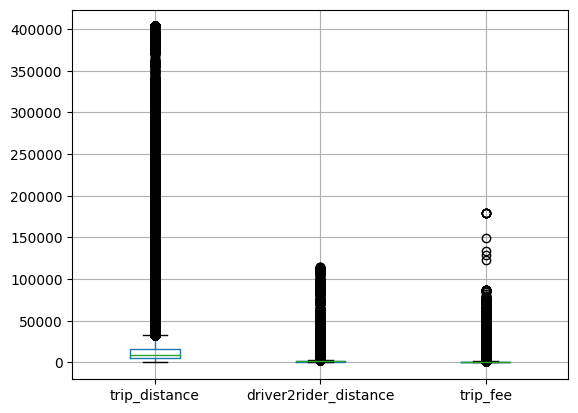

In [ ]:
boxplot = df.boxplot(column=['trip_distance', 'driver2rider_distance', 'trip_fee'])
# Outlier Detection using IQR
Q1 = df['trip_distance'].quantile(0.25)
Q3 = df['trip_distance'].quantile(0.75)
IQR = Q3-Q1

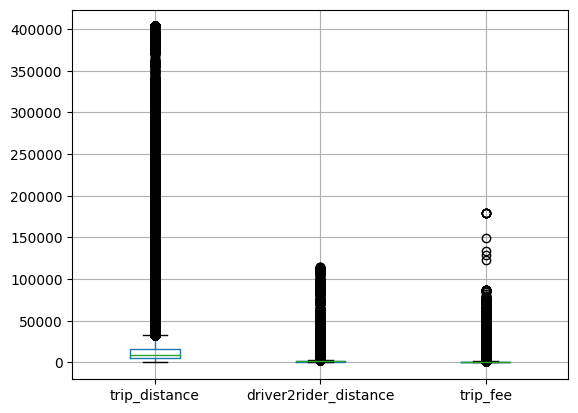

In [ ]:
df_remove_outliers = df[((df['trip_distance'] >= (Q1-1.5*IQR)) | (df['trip_distance'] <= (Q3+1.5*IQR)))]
boxplot = df_remove_outliers.boxplot(column=['trip_distance', 'driver2rider_distance', 'trip_fee'])


In [ ]:
#df['trip_fee'].describe()
#df['driver2rider_distance'].describe()
#df["trip_distance"].describe()



In [ ]:
df["rider_cancel_reason"].unique()

array([nan, 'UNDEFINED', 'UNREACHABLE', 'TEST', 'TOOK_OTHER_TRANSPORT',
       'OTHER', 'DASHBOARD_CANCEL_REASON'], dtype=object)

In [ ]:
ds.isnull().sum()

##Correaltion map

In [ ]:
def plot_correlation_map(df):
    corr = df.corr()
    s , ax = plt.subplots( figsize =( 12 , 10 ) )
    cmap = sns.diverging_palette( 220 , 10 , as_cmap = True )
    s = sns.heatmap(
        corr,
        cmap = cmap,
        square=True,
        cbar_kws={ 'shrink' : .9 },
        ax=ax,
        annot = True,
        annot_kws = { 'fontsize' : 12 }
      )

In [ ]:
#df.corr()

plot_correlation_map(df)
#df.drop("Unnamed: 0", axis=1,inplace= True )

##train,test

###label-encoding pickup and destination

In [ ]:

from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder


In [ ]:
enc= LabelEncoder()

In [ ]:
df["pickup_city"]=enc.fit_transform(df["pickup_city"])
df["destination_city"]=enc.fit_transform(df["destination_city"])
df["duration"] = enc.fit_transform(df["duration"])
df["day_week"] = enc.fit_transform(df["day_week"])
df["time_day"] = enc.fit_transform(df["time_day"])








In [ ]:
#X = df[["driver2rider_distance" , "trip_distance" , "pickup_city" , "destination_city" ,"duration" ]]
#X = df[["driver2rider_distance" , "trip_distance" , "pickup_city" , "destination_city"  ]]
#X = df[["trip_distance" ]]
#X = df[["driver2rider_distance" , "trip_distance" , "pickup_city" , "destination_city" , "duration" , "day_week","time_day" ]]
#X = df[["driver2rider_distance" , "trip_distance" , "pickup_city" , "destination_city" , "duration" ]]
X = df[["trip_distance" , "driver2rider_distance" ]]
#X = df[["trip_distance" ]]
#X = df_fini[["trip_distance" , ""]]
#X = df[["driver2rider_distance" , "trip_distance" ]]

Y = df["trip_fee"]

In [ ]:
#X_test = ds[["driver2rider_distance" , "trip_distance"]]
#Y_test = ds["trip_fee"]

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X,Y , test_size=0.33, random_state=42)


In [ ]:
import pandas as pd

# Supposons que df_map soit un DataFrame Pandas contenant la variable trip_distance

# Calcul des quantiles
quantiles_td = df['trip_distance'].quantile([0.01, 0.995])

# Winsorization pour la variable trip_distance
df['trip_distance'] = df['trip_distance'].clip(lower=quantiles_td.iloc[0], upper=quantiles_td.iloc[1])


###label_encoding test

In [ ]:
test_data["pickup_city"]=enc.fit_transform(test_data["pickup_city"])
test_data["destination_city"]=enc.fit_transform(test_data["destination_city"])
test_data["duration"] = enc.fit_transform(test_data["duration"])
test_data["day_week"] = enc.fit_transform(test_data["day_week"])
test_data["time_day"] = enc.fit_transform(test_data["time_day"])





##model2 XG_BOOST

In [ ]:
import numpy as np
import pandas as pd
from sklearn import preprocessing
import xgboost as xgb
from xgboost.sklearn import XGBRegressor
import datetime
from sklearn.model_selection import GridSearchCV

In [ ]:
xgb1 = XGBRegressor()
parameters = {'nthread':[4],
              'objective':['reg:linear'],
              'learning_rate': [.03, 0.05, .07],
              'max_depth': [5, 6, 7],
              'min_child_weight': [4],
              'silent': [1],
              'subsample': [0.7],
              'colsample_bytree': [0.7],
              'n_estimators': [500]}

xgb_grid = GridSearchCV(xgb1,
                        parameters,
                        cv = 2,
                        n_jobs = 5,
                        verbose=True)



In [ ]:
xgb_grid.fit(X_train,Y_train)

print(xgb_grid.best_score_)
print(xgb_grid.best_params_)

Fitting 2 folds for each of 9 candidates, totalling 18 fits


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [10:11:23] WARNING: /workspace/src/objective/regression_obj.cu:209: reg:linear is now deprecated in favor of reg:squarederror.
  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [10:11:23] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "silent" } are not used.

  warnings.warn(smsg, UserWarning)


0.7488673651429245
{'colsample_bytree': 0.7, 'learning_rate': 0.07, 'max_depth': 5, 'min_child_weight': 4, 'n_estimators': 500, 'nthread': 4, 'objective': 'reg:linear', 'silent': 1, 'subsample': 0.7}


In [ ]:
# Initialiser le modèle
model_2 = xgb.XGBRegressor()
#iteration , #alpha ,#

In [ ]:
# Entraîner le modèle
model_2.fit(X_train, Y_train)

In [ ]:
# Prédire les valeurs sur l'ensemble de test
y_pred = model_2.predict(X_test)

In [ ]:
print(y_pred)

[ 388.6521  1006.1564   339.54752 ...  476.8016  1814.1619   301.9293 ]


In [ ]:
import numpy as np
mse = mean_squared_error(Y_test, y_pred)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)
#print(mse)

Root Mean Squared Error (RMSE): 1303.7120714246537


##model1 : linear Regressions

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LinearRegression

In [ ]:
#X = df[["trip_distance" , "trip_status"]]


In [ ]:
# Initialiser le modèle et l'entraîner
model = LinearRegression()
model.fit(X_train, Y_train)

In [ ]:
y_pred = model.predict(X_test)
print(y_pred)  # Affiche les valeurs prédites

In [ ]:
mse = mean_squared_error(Y_test, y_pred)
rmse = np.sqrt(mse)
#r2 = r2_score(Y_test, y_pred)

#print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
#print("R-squared (R2) Score:", r2)

NameError: name 'y_pred' is not defined

In [ ]:
#y_pred_sur_test = model.predict(dt)

##model3

In [ ]:

# Initialiser le modèle
model_3 = SVR( )



In [ ]:
# Entraîner le modèle
model_3.fit(X_train, Y_train)



In [ ]:
# Prédire les valeurs sur l'ensemble de test
y_pred = model_3.predict(X_test)



In [ ]:
mse = mean_squared_error(Y_test, y_pred)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)

##model4

In [ ]:
from sklearn import linear_model
clf = linear_model.LinearRegression()
clf.fit(X_train, Y_train)


from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
X, y = make_regression(n_features=4, n_informative=2,random_state=0, shuffle=False)
regr = RandomForestRegressor(max_depth=2, random_state=0)
regr.fit(X, y)
RandomForestRegressor(...)


In [ ]:
y_pred = clf.predict(X_test)
print(y_pred)  # Affiche les valeurs prédites

In [ ]:
mse = mean_squared_error(Y_test, y_pred)
rmse = np.sqrt(mse)
#r2 = r2_score(Y_test, y_pred)

#print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
#print("R-squared (R2) Score:", r2)

##model5

In [ ]:
from sklearn.linear_model import Ridge, Lasso

# For Ridge Regression
ridge_model = Ridge(alpha=1.0)  # Adjust alpha as needed
ridge_model.fit(X_train, Y_train)




Ridge()

In [ ]:
y_pred = model_6.predict(X_test)
print(y_pred)  # Affiche les valeurs prédites

[ 331.80031012 1081.59227586  330.91801417 ...  667.92844478  270.93658256
  488.33217495]


In [ ]:
mse = mean_squared_error(Y_test, y_pred)
rmse = np.sqrt(mse)
#r2 = r2_score(Y_test, y_pred)

#print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
#print("R-squared (R2) Score:", r2)

Root Mean Squared Error (RMSE): 752.9983830509447


##model6

In [ ]:
from sklearn.linear_model import BayesianRidge

model_6 = BayesianRidge()
model_6.fit(X_train, Y_train)


BayesianRidge()

##model7 ;-

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression


random_forest_regressor=RandomForestRegressor()
random_forest_regressor.fit(X_train,Y_train)


##submission

In [ ]:
sub = pd.read_csv("/content/sample_submission.csv")
sub

,id,trip_fee
0,N7aPBXp0Flm5,0
1,tOwj3FIL1IzN,0
2,DPHis6MSuc2R,0
3,uJTNO4TrLHMV,0
4,jpyQzGklCqrU,0
...,...,...
276464,jmTTm25K3RVL,0
276465,3uw4DIshv6Mq,0
276466,YKBd0m9ileHK,0
276467,rFOqiDcjHGGX,0


In [ ]:
test_data = pd.read_csv("/content/test.csv")
test_data.head()

,id,request_date,pickup_city,destination_city,accepted_date,started_date,rider,driver,trip_distance,driver2rider_distance,used_discount,trip_status,trip_finished_date,rider_rating,driver_rating,rider_cancel_reason,driver_cancel_reason,discount_amount
0,N7aPBXp0Flm5,2021-06-27 08:52:14.396,Alger,Alger,2021-06-27 08:53:06.243,NaN,EIdLWfrGHFCa,6VwbRFt8nlkk,305,85,0,NOT_FINISHED,NaN,NaN,NaN,NaN,NaN,NaN
1,tOwj3FIL1IzN,2021-06-07 14:17:31.774,Alger,Alger,2021-06-07 14:18:18.363,2021-06-07 14:29:24.456,QFi4jOwMNjPr,eYnWva0Z38su,19812,1670,0,FINISHED,2021-06-07 14:50:46.282,5.0,5.0,NaN,NaN,NaN
2,DPHis6MSuc2R,2021-06-10 12:26:58.441,Alger,Alger,2021-06-10 12:30:59.679,NaN,EjU9WldJx4YE,MhxlpBF3aXEa,6413,988,1,NOT_FINISHED,NaN,NaN,NaN,NaN,NaN,500.0
3,uJTNO4TrLHMV,2021-06-22 07:49:42.712,Tipaza,Alger,NaN,NaN,0Frx3EFp91pw,yOf6NbYVTVAl,25698,1457,1,NOT_FINISHED,NaN,NaN,NaN,NaN,NaN,9999.0
4,jpyQzGklCqrU,2021-06-10 11:04:24.347,Alger,Alger,NaN,NaN,GpQb0nV4AnyV,yOf6NbYVTVAl,8518,1128,1,NOT_FINISHED,NaN,NaN,NaN,NaN,NaN,500.0


In [ ]:
# Check the features in the training data
print(model.feature_names_in_)

# Check the features in the test data
print(test_data.columns)

In [ ]:
#test_data["trip_status"] = enc.fit_transform(test_data["trip_status"])



In [ ]:
#y_pred_test= model.predict(test_data[["driver2rider_distance" , "trip_distance" ,"pickup_city" ,"destination_city" ,"duration" , "day_week" , "time_day"]])
#y_pred_test = model.predict(test_data[["driver2rider_distance" , "trip_distance" , "pickup_city" , "destination_city" , "duration" , "day_week","time_day" ]])
#X = df[["driver2rider_distance" , "trip_distance" , "pickup_city" , "destination_city" , "duration" , "day_week","time_day" ]]

#y_pred_test_2 = model.predict(test_data[["driver2rider_distance" , "trip_distance" ,"pickup_city" ,"destination_city" ,"duration" , "day_week" , "time_day"]])
#y_pred_5 = ridge_model.predict(test_data[["driver2rider_distance" , "trip_distance" ,"pickup_city" ,"destination_city" ,"duration" , "day_week"]])

#y_pred_test= model.predict(test_data[[  "trip_distance" , "trip_status"]])
#y_pred_test_2 = model_2.predict(test_data[["driver2rider_distance" , "trip_distance" ,"pickup_city" ,"destination_city" ,"duration"]])
#y_pred_test_2 = model.predict(test_data[["driver2rider_distance" , "trip_distance" ,"pickup_city" ,"destination_city" ,"duration"]])
#y_pred_test_2 = model.predict(test_data[["driver2rider_distance" , "trip_distance" ,"pickup_city" ,"destination_city" ,"duration"]])
#y_pred_test_2 = model.predict(test_data[["driver2rider_distance" , "trip_distance" , "pickup_city" , "destination_city" , "duration" ]])




y_pred_test_2 = model.predict(test_data[[ "trip_distance" , "driver2rider_distance"  ]])

#X = df[["driver2rider_distance" , "trip_distance" ,"pickup_city" ,"destination_city"  ]]



In [ ]:
#y_pred_test_4= model.predict(test_data[[ "trip_distance" ]])


In [ ]:
#y_pred_test =model_2.predict(test_data[["driver2rider_distance" , "trip_distance" ,"pickup_city" ,"destination_city" ]])


In [ ]:
#sub_finis = sub[sub["trip_status"]=="FINISHED"]


In [ ]:
sub["trip_fee"]= y_pred_test_2

In [ ]:
sub

In [ ]:
file_path = '/content/submit_fgl.csv'
sub.to_csv(file_path, index=False)

##importing libriries

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
import xgboost as xgb
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
import numpy as np
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split



##Reading data_frame

In [ ]:
df = pd.read_csv("/content/train.csv")
df.head(3)

,id,request_date,pickup_city,destination_city,accepted_date,started_date,rider,driver,trip_distance,driver2rider_distance,used_discount,trip_status,trip_finished_date,rider_rating,driver_rating,rider_cancel_reason,driver_cancel_reason,discount_amount,trip_fee
0,LVwq2xeA5mMt,2021-01-30 14:06:19.94,Constantine,Constantine,2021-01-30 14:07:04.707,NaN,E1B3rg1jOiBF,DVwusPupJeU4,16035.0,1927.0,0.0,NOT_FINISHED,NaN,NaN,NaN,NaN,NaN,NaN,511.0
1,U9CuIIRyArx0,2021-05-18 07:54:39.922,Alger,Alger,2021-05-18 07:55:05.362,2021-05-18 08:03:23.664,u7zilHWibXpk,Mv2dXvQt5e5i,12031.0,1884.0,0.0,FINISHED,2021-05-18 08:32:03.611,4.0,5.0,NaN,NaN,NaN,579.0
2,ke1gwcPZ93Nl,2021-03-05 13:17:24.999,Oran,Oran,NaN,NaN,NmumknIUfHYy,yOf6NbYVTVAl,16812.0,994.0,0.0,NOT_FINISHED,NaN,NaN,NaN,NaN,NaN,NaN,706.0


In [ ]:
df.info()
#df.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 533518 entries, 0 to 533517
Data columns (total 19 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   id                     533518 non-null  object 
 1   request_date           533518 non-null  object 
 2   pickup_city            533517 non-null  object 
 3   destination_city       533517 non-null  object 
 4   accepted_date          357594 non-null  object 
 5   started_date           244985 non-null  object 
 6   rider                  533517 non-null  object 
 7   driver                 533517 non-null  object 
 8   trip_distance          533517 non-null  float64
 9   driver2rider_distance  533517 non-null  float64
 10  used_discount          533517 non-null  float64
 11  trip_status            533517 non-null  object 
 12  trip_finished_date     247344 non-null  object 
 13  rider_rating           239378 non-null  float64
 14  driver_rating          243753 non-nu

In [ ]:
df.isnull().sum()

id                            0
request_date                  0
pickup_city                   1
destination_city              1
accepted_date            175924
started_date             288533
rider                         1
driver                        1
trip_distance                 1
driver2rider_distance         1
used_discount                 1
trip_status                   1
trip_finished_date       286174
rider_rating             294140
driver_rating            289765
rider_cancel_reason      526104
driver_cancel_reason     526104
discount_amount          495597
trip_fee                      1
dtype: int64

# Client (riders) segmentations

In [ ]:
data=pd.read_csv('/train.csv')
data

In [ ]:

valeurs_manquantes = data['pickup_city'].isnull().sum()

print("Nombre de valeurs manquantes dans la colonne :", valeurs_manquantes)


In [ ]:
data['pickup_city'].unique()

In [ ]:
data['pickup_city'].value_counts()

In [ ]:
# Calculer le pourcentage total des villes qui ont moins de 1%
total_percent = data["pickup_city"].value_counts(normalize=True) * 100
other_percent = total_percent[total_percent < 1].sum()

# Filtrer les villes qui ont un pourcentage inférieur à 1%
cities_above_one_percent = total_percent[total_percent >= 1]
cities_above_one_percent['Other'] = other_percent

# Créer le pie chart
plt.figure(figsize=(10, 10))
plt.pie(cities_above_one_percent, labels=cities_above_one_percent.index, autopct="%1.1f%%", wedgeprops=wedgeprops, textprops=textprops)
plt.title("Diagramme circulaire des villes de prise en charge")

# Enregistrer le diagramme en haute résolution
plt.savefig("diagramme_villes.png", dpi=300)

# Afficher le diagramme
plt.show()

In [ ]:
valeurs_manquantes = data['request_date'].isnull().sum()


print("Nombre de valeurs manquantes dans la colonne :", valeurs_manquantes)

In [ ]:
df = pd.DataFrame(data)
df['request_date'] = pd.to_datetime(df['request_date'])
df['hour'] = df['request_date'].dt.hour

In [ ]:
plt.figure(figsize=(10, 6))
plt.hist(df['hour'], bins=24, color='skyblue', edgecolor='black')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Requests')
plt.title('Distribution of Request Hours')
plt.xticks(range(24))

plt.show()

In [ ]:
#Time-series-transformation :
request_date = pd.to_datetime(df["request_date"], format="%Y-%m-%d %H:%M:%S")
#jour de la semaine
day_week = request_date.dt.day_name()

In [ ]:
plt.figure(figsize=(10, 6))
day_week.value_counts().plot(kind='bar', color='orange')
plt.title('Requests by Day of Week')
plt.xlabel('Day of Week')
plt.ylabel('Number of Requests')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
valeurs_manquantes = data['rider_rating'].isnull().sum()

print("Nombre de valeurs manquantes dans la colonne :", valeurs_manquantes)

In [ ]:
df.dropna(inplace=True)

In [ ]:
plt.figure(figsize=(8, 6))
sns.countplot(x='rider_rating', data=df)
plt.title('Count of Rider Ratings')
plt.xlabel('Rider Rating')
plt.ylabel('Count')
plt.show()

##KPI Perform a performance evaluation for partners

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np


In [ ]:
data["trip_finished_date"] = data["trip_finished_date"].fillna(0)
data["accepted_date"]=data["accepted_date"].fillna(0)
data["started_date"]=data["started_date"].fillna(0)

In [ ]:
#Time-series-transformation :
finish_date = pd.to_datetime(data["trip_finished_date"], format="%Y-%m-%d %H:%M:%S")
#started_date = pd.to_datetime(df["started_date"], format="%Y-%m-%d %H:%M:%S")
accepted_date = pd.to_datetime(data["accepted_date"], format="%Y-%m-%d %H:%M:%S")
duration = finish_date - accepted_date


In [ ]:
duration_frame = duration.to_frame()


In [ ]:
data['duration'] = duration_frame
data

In [ ]:
#The column is an empty vector for now
data = data.assign(accepted='')
data

In [ ]:
#Assign values for each row of the column accepted based on if the ride is accepted or not (1yes, 0no)
for index, row in data.iterrows():
    if row['accepted_date'] == 0:
        data.at[index, 'accepted'] = 0
    else:
        data.at[index, 'accepted'] = 1

In [ ]:
data

In [ ]:
data["accepted"]=data["accepted"].fillna(0)

In [ ]:
data

In [ ]:
Acceptance_rate=data.groupby('driver')['accepted'].sum() / data.groupby('driver')['id'].count()
Acceptance_rate

In [ ]:
KPI = Acceptance_rate.reset_index()
KPI.columns = ['driver' ,'Acceptance_rate']
KPI

In [ ]:
KPI = Acceptance_rate.reset_index()
KPI.columns = ['driver' ,'Acceptance_rate']
KPI

In [ ]:
#We created this new data based on the original one in order to settle only for the observations of the accepted rides
data_fini = data[data["trip_status"]=="FINISHED"]
data_fini

In [ ]:
Average_Trip_Distance=data_fini.groupby('driver')['trip_distance'].mean()
Average_Trip_Distance

In [ ]:
Average_Trip_Distance=Average_Trip_Distance.reset_index()
Average_Trip_Distance.columns=['driver', 'Average_Trip_Distance']
Average_Trip_Distance

In [ ]:
KPI = pd.merge(Average_Trip_Distance, KPI, on='driver', how='inner')
KPI

In [ ]:
Average_Trip_Duration=data_fini.groupby('driver')['duration'].mean()
Average_Trip_Duration

In [ ]:
Average_Trip_Duration=Average_Trip_Duration.reset_index()
Average_Trip_Duration.columns=['driver', 'Average_Trip_Duration']
Average_Trip_Duration

In [ ]:
KPI = pd.merge(Average_Trip_Duration, KPI, on='driver', how='inner')
KPI

In [ ]:
rating=data_fini.groupby('driver')['driver_rating'].mean()
rating

In [ ]:
rating=rating.reset_index()
rating.columns=['driver', 'rating']
rating

In [ ]:
KPI = pd.merge(rating, KPI, on='driver', how='inner')
KPI

In [ ]:
descriptive_stats = KPI.describe()
descriptive_stats

In [ ]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler

In [ ]:
corr_matrix = KPI.corr()
print(corr_matrix)

In [ ]:
data_fini['trip_distance'] = pd.to_numeric(data_fini['trip_distance'], errors='coerce')

In [ ]:

from sklearn.preprocessing import MinMaxScaler


# Convert 'Average_Trip_Distance' to numeric values and handle non-convertible values with NaN
KPI['Average_Trip_Distance'] = pd.to_numeric(KPI['Average_Trip_Distance'], errors='coerce')

# Drop NaN values, if any
KPI.dropna(subset=['Average_Trip_Distance'], inplace=True)

# Reshape the 'Average_Trip_Distance' column to a 2D array, as required by MinMaxScaler
disvalues = KPI['Average_Trip_Distance'].values.reshape(-1, 1)

# Instantiate MinMaxScaler
scaler = MinMaxScaler()

# Fit and transform the 'Average_Trip_Distance' values
normalized_dis = scaler.fit_transform(disvalues)

# Assign the normalized values back to the 'Average_Trip_Distance' column
KPI['Average_Trip_Distance'] = normalized_dis.flatten()

# If you want to see the updated DataFrame

KPI


In [ ]:
from sklearn.preprocessing import MinMaxScaler


# Convert 'acceptance_rate' to numeric values and handle non-convertible values with NaN
KPI['Acceptance_rate'] = pd.to_numeric(KPI['Acceptance_rate'], errors='coerce')

# Drop NaN values, if any
KPI.dropna(subset=['Acceptance_rate'], inplace=True)

# Reshape the 'acceptance_rate' column to a 2D array, as required by MinMaxScaler
accvalues = KPI['Acceptance_rate'].values.reshape(-1, 1)

# Instantiate MinMaxScaler
scaler = MinMaxScaler()

# Fit and transform the 'acceptance_rate' values
normalized_acc = scaler.fit_transform(accvalues)

# Assign the normalized values back to the 'acceptance_rate' column
KPI['Acceptance_rate'] = normalized_acc.flatten()

# If you want to see the updated DataFrame

KPI

In [ ]:
from sklearn.preprocessing import MinMaxScaler


# Convert 'Cancelled_rate' to numeric values and handle non-convertible values with NaN
KPI['cancelled_rate'] = pd.to_numeric(KPI['cancelled_rate'], errors='coerce')

# Drop NaN values, if any
KPI.dropna(subset=['cancelled_rate'], inplace=True)

# Reshape the 'Cancelled_rate' column to a 2D array, as required by MinMaxScaler
canvalues = KPI['cancelled_rate'].values.reshape(-1, 1)

# Instantiate MinMaxScaler
scaler = MinMaxScaler()

# Fit and transform the 'Cancelled_rate' values
normalized_can = scaler.fit_transform(canvalues)

# Assign the normalized values back to the 'Cancelled_rate' column
KPI['cancelled_rate'] = normalized_can.flatten()

# If you want to see the updated DataFrame

KPI

In [ ]:
from sklearn.preprocessing import MinMaxScaler


# Convert 'rating' to numeric values and handle non-convertible values with NaN
KPI['rating'] = pd.to_numeric(KPI['rating'], errors='coerce')

# Drop NaN values, if any
KPI.dropna(subset=['rating'], inplace=True)

# Reshape the 'rating' column to a 2D array, as required by MinMaxScaler
ratvalues = KPI['rating'].values.reshape(-1, 1)

# Instantiate MinMaxScaler
scaler = MinMaxScaler()

# Fit and transform the 'rating' values
normalized_rat = scaler.fit_transform(ratvalues)

# Assign the normalized values back to the 'rating' column
KPI['rating'] = normalized_rat.flatten()

# If you want to see the updated DataFrame

KPI

In [ ]:
variables={'rating','Average_Trip_Distance', 'Acceptance_rate', 'calcelled_rate', 'Average_Trip_Duration'}

In [ ]:
weights = {'rating': 0.4, 'Average_Trip_Distance': 0.1, 'Acceptance_rate': 0.2, 'cancelled_rate': 0.2, 'Average_Trip_Duration':0.1}

In [ ]:
KPI['Combined_Score'] = (KPI['rating'] * weights['rating'] +
                          KPI['Average_Trip_Distance'] * weights['Average_Trip_Distance'] +
                          KPI['Acceptance_rate'] * weights['Acceptance_rate'] +
                          KPI['cancelled_rate'] * weights['cancelled_rate']
                         )

In [ ]:
KPI['Combined_Score'] = (KPI['rating'] * weights['rating'] +
                          KPI['Average_Trip_Distance'] * weights['Average_Trip_Distance'] +
                          KPI['Acceptance_rate'] * weights['Acceptance_rate'] +
                          KPI['cancelled_rate'] * weights['cancelled_rate'] +
                          KPI['Average_Trip_Duration']* weights['Average_Trip_Duration'])

In [ ]:
ranked_drivers = KPI.sort_values(by='Combined_Score', ascending=False)

In [ ]:
print(ranked_drivers[['driver', 'Combined_Score']])

##Time series handling

In [ ]:
#replace by mean :

#df["started_date"].fillna(df["started_date"].mean() ,inplace=True )
#df["trip_finished_date"].fillna(df["trip_finished_date"].mean() , inplace=True)

#Drop
#df.dropna(subset=['accepted_date', 'trip_finished_date'], inplace=True)

#fill nan finished with zero


#df["trip_finished_date"] = df["trip_finished_date"].fillna(0)


In [ ]:
#Time-series-transformation :
finish_date = pd.to_datetime(df["trip_finished_date"], format="%Y-%m-%d %H:%M:%S")
#started_date = pd.to_datetime(df["started_date"], format="%Y-%m-%d %H:%M:%S")
accepted_date = pd.to_datetime(df["accepted_date"], format="%Y-%m-%d %H:%M:%S")
duration = finish_date - accepted_date
time_day = accepted_date.dt.hour
#jour de la semaine
day_week = finish_date.dt.dayofweek

In [ ]:
duration_frame = duration.to_frame()
time_day_frame= time_day.to_frame() ###not yet
day_week_frame = day_week.to_frame()

In [ ]:
#df.columns
#df[0].rename("duration" , inplace=True)


df["duration"]=duration_frame
df["day_week"] = day_week_frame
df["time_day"] = time_day_frame


df["duration"] = df["duration"].dropna
df["day_week"] = df["day_week"].dropna
df["time_day"] = df["time_day"].dropna



##status_trip

##Fonction des TS for le test df

In [ ]:
#test_data["trip_finished_date"] = test_data["trip_finished_date"].fillna(0)


In [ ]:
#Time-series-transformation :
finish_date_test = pd.to_datetime(test_data["trip_finished_date"], format="%Y-%m-%d %H:%M:%S")
#started_date = pd.to_datetime(df["started_date"], format="%Y-%m-%d %H:%M:%S")
accepted_date_test = pd.to_datetime(test_data["accepted_date"], format="%Y-%m-%d %H:%M:%S")
duration_date_test = finish_date_test - accepted_date_test
time_day_test = accepted_date_test.dt.hour
#jour de la semaine
day_week_test = finish_date_test.dt.dayofweek

In [ ]:
duration_frame_test = duration_date_test.to_frame()
time_day_frame_test= time_day_test.to_frame()
day_week_frame_test = day_week_test.to_frame()


In [ ]:
#df.columns
#df[0].rename("duration" , inplace=True)



test_data["duration"]=duration_frame_test
test_data["day_week"] = day_week_frame_test
test_data["time_day"] = time_day_frame_test



In [ ]:
test_data["duration"] = test_data["duration"].dropna
test_data["day_week"] = test_data["day_week"].dropna
test_data["time_day"] = test_data["time_day"].dropna


##boxplot

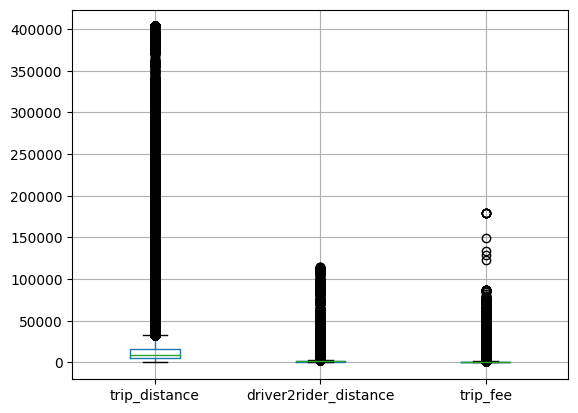

In [ ]:
boxplot = df.boxplot(column=['trip_distance', 'driver2rider_distance', 'trip_fee'])
# Outlier Detection using IQR
Q1 = df['trip_distance'].quantile(0.25)
Q3 = df['trip_distance'].quantile(0.75)
IQR = Q3-Q1

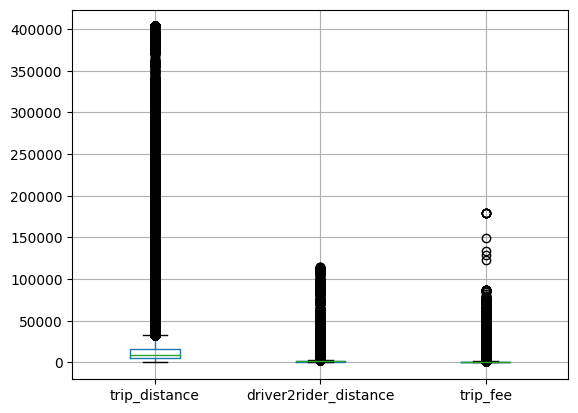

In [ ]:
df_remove_outliers = df[((df['trip_distance'] >= (Q1-1.5*IQR)) | (df['trip_distance'] <= (Q3+1.5*IQR)))]
boxplot = df_remove_outliers.boxplot(column=['trip_distance', 'driver2rider_distance', 'trip_fee'])


In [ ]:
#df['trip_fee'].describe()
#df['driver2rider_distance'].describe()
#df["trip_distance"].describe()



In [ ]:
df["rider_cancel_reason"].unique()

array([nan, 'UNDEFINED', 'UNREACHABLE', 'TEST', 'TOOK_OTHER_TRANSPORT',
       'OTHER', 'DASHBOARD_CANCEL_REASON'], dtype=object)

In [ ]:
ds.isnull().sum()

##Correaltion map

In [ ]:
def plot_correlation_map(df):
    corr = df.corr()
    s , ax = plt.subplots( figsize =( 12 , 10 ) )
    cmap = sns.diverging_palette( 220 , 10 , as_cmap = True )
    s = sns.heatmap(
        corr,
        cmap = cmap,
        square=True,
        cbar_kws={ 'shrink' : .9 },
        ax=ax,
        annot = True,
        annot_kws = { 'fontsize' : 12 }
      )

In [ ]:
#df.corr()

plot_correlation_map(df)
#df.drop("Unnamed: 0", axis=1,inplace= True )

##train,test

###label-encoding pickup and destination

In [ ]:

from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder


In [ ]:
enc= LabelEncoder()

In [ ]:
df["pickup_city"]=enc.fit_transform(df["pickup_city"])
df["destination_city"]=enc.fit_transform(df["destination_city"])
df["duration"] = enc.fit_transform(df["duration"])
df["day_week"] = enc.fit_transform(df["day_week"])
df["time_day"] = enc.fit_transform(df["time_day"])








In [ ]:
#X = df[["driver2rider_distance" , "trip_distance" , "pickup_city" , "destination_city" ,"duration" ]]
#X = df[["driver2rider_distance" , "trip_distance" , "pickup_city" , "destination_city"  ]]
#X = df[["trip_distance" ]]
#X = df[["driver2rider_distance" , "trip_distance" , "pickup_city" , "destination_city" , "duration" , "day_week","time_day" ]]
#X = df[["driver2rider_distance" , "trip_distance" , "pickup_city" , "destination_city" , "duration" ]]
X = df[["trip_distance" , "driver2rider_distance" ]]
#X = df[["trip_distance" ]]
#X = df_fini[["trip_distance" , ""]]
#X = df[["driver2rider_distance" , "trip_distance" ]]

Y = df["trip_fee"]

In [ ]:
#X_test = ds[["driver2rider_distance" , "trip_distance"]]
#Y_test = ds["trip_fee"]

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X,Y , test_size=0.33, random_state=42)


In [ ]:
import pandas as pd

# Supposons que df_map soit un DataFrame Pandas contenant la variable trip_distance

# Calcul des quantiles
quantiles_td = df['trip_distance'].quantile([0.01, 0.995])

# Winsorization pour la variable trip_distance
df['trip_distance'] = df['trip_distance'].clip(lower=quantiles_td.iloc[0], upper=quantiles_td.iloc[1])


###label_encoding test

In [ ]:
test_data["pickup_city"]=enc.fit_transform(test_data["pickup_city"])
test_data["destination_city"]=enc.fit_transform(test_data["destination_city"])
test_data["duration"] = enc.fit_transform(test_data["duration"])
test_data["day_week"] = enc.fit_transform(test_data["day_week"])
test_data["time_day"] = enc.fit_transform(test_data["time_day"])





##model2 XG_BOOST

In [ ]:
import numpy as np
import pandas as pd
from sklearn import preprocessing
import xgboost as xgb
from xgboost.sklearn import XGBRegressor
import datetime
from sklearn.model_selection import GridSearchCV

In [ ]:
xgb1 = XGBRegressor()
parameters = {'nthread':[4],
              'objective':['reg:linear'],
              'learning_rate': [.03, 0.05, .07],
              'max_depth': [5, 6, 7],
              'min_child_weight': [4],
              'silent': [1],
              'subsample': [0.7],
              'colsample_bytree': [0.7],
              'n_estimators': [500]}

xgb_grid = GridSearchCV(xgb1,
                        parameters,
                        cv = 2,
                        n_jobs = 5,
                        verbose=True)



In [ ]:
xgb_grid.fit(X_train,Y_train)

print(xgb_grid.best_score_)
print(xgb_grid.best_params_)

Fitting 2 folds for each of 9 candidates, totalling 18 fits


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [10:11:23] WARNING: /workspace/src/objective/regression_obj.cu:209: reg:linear is now deprecated in favor of reg:squarederror.
  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [10:11:23] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "silent" } are not used.

  warnings.warn(smsg, UserWarning)


0.7488673651429245
{'colsample_bytree': 0.7, 'learning_rate': 0.07, 'max_depth': 5, 'min_child_weight': 4, 'n_estimators': 500, 'nthread': 4, 'objective': 'reg:linear', 'silent': 1, 'subsample': 0.7}


In [ ]:
# Initialiser le modèle
model_2 = xgb.XGBRegressor()
#iteration , #alpha ,#

In [ ]:
# Entraîner le modèle
model_2.fit(X_train, Y_train)

In [ ]:
# Prédire les valeurs sur l'ensemble de test
y_pred = model_2.predict(X_test)

In [ ]:
print(y_pred)

[ 388.6521  1006.1564   339.54752 ...  476.8016  1814.1619   301.9293 ]


In [ ]:
import numpy as np
mse = mean_squared_error(Y_test, y_pred)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)
#print(mse)

Root Mean Squared Error (RMSE): 1303.7120714246537


##model1 : linear Regressions

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LinearRegression

In [ ]:
#X = df[["trip_distance" , "trip_status"]]


In [ ]:
# Initialiser le modèle et l'entraîner
model = LinearRegression()
model.fit(X_train, Y_train)

In [ ]:
y_pred = model.predict(X_test)
print(y_pred)  # Affiche les valeurs prédites

In [ ]:
mse = mean_squared_error(Y_test, y_pred)
rmse = np.sqrt(mse)
#r2 = r2_score(Y_test, y_pred)

#print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
#print("R-squared (R2) Score:", r2)

NameError: name 'y_pred' is not defined

In [ ]:
#y_pred_sur_test = model.predict(dt)

##model3

In [ ]:

# Initialiser le modèle
model_3 = SVR( )



In [ ]:
# Entraîner le modèle
model_3.fit(X_train, Y_train)



In [ ]:
# Prédire les valeurs sur l'ensemble de test
y_pred = model_3.predict(X_test)



In [ ]:
mse = mean_squared_error(Y_test, y_pred)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)

##model4

In [ ]:
from sklearn import linear_model
clf = linear_model.LinearRegression()
clf.fit(X_train, Y_train)


from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
X, y = make_regression(n_features=4, n_informative=2,random_state=0, shuffle=False)
regr = RandomForestRegressor(max_depth=2, random_state=0)
regr.fit(X, y)
RandomForestRegressor(...)


In [ ]:
y_pred = clf.predict(X_test)
print(y_pred)  # Affiche les valeurs prédites

In [ ]:
mse = mean_squared_error(Y_test, y_pred)
rmse = np.sqrt(mse)
#r2 = r2_score(Y_test, y_pred)

#print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
#print("R-squared (R2) Score:", r2)

##model5

In [ ]:
from sklearn.linear_model import Ridge, Lasso

# For Ridge Regression
ridge_model = Ridge(alpha=1.0)  # Adjust alpha as needed
ridge_model.fit(X_train, Y_train)




Ridge()

In [ ]:
y_pred = model_6.predict(X_test)
print(y_pred)  # Affiche les valeurs prédites

[ 331.80031012 1081.59227586  330.91801417 ...  667.92844478  270.93658256
  488.33217495]


In [ ]:
mse = mean_squared_error(Y_test, y_pred)
rmse = np.sqrt(mse)
#r2 = r2_score(Y_test, y_pred)

#print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
#print("R-squared (R2) Score:", r2)

Root Mean Squared Error (RMSE): 752.9983830509447


##model6

In [ ]:
from sklearn.linear_model import BayesianRidge

model_6 = BayesianRidge()
model_6.fit(X_train, Y_train)


BayesianRidge()

##model7 ;-

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression


random_forest_regressor=RandomForestRegressor()
random_forest_regressor.fit(X_train,Y_train)


##submission

In [ ]:
sub = pd.read_csv("/content/sample_submission.csv")
sub

,id,trip_fee
0,N7aPBXp0Flm5,0
1,tOwj3FIL1IzN,0
2,DPHis6MSuc2R,0
3,uJTNO4TrLHMV,0
4,jpyQzGklCqrU,0
...,...,...
276464,jmTTm25K3RVL,0
276465,3uw4DIshv6Mq,0
276466,YKBd0m9ileHK,0
276467,rFOqiDcjHGGX,0


In [ ]:
test_data = pd.read_csv("/content/test.csv")
test_data.head()

,id,request_date,pickup_city,destination_city,accepted_date,started_date,rider,driver,trip_distance,driver2rider_distance,used_discount,trip_status,trip_finished_date,rider_rating,driver_rating,rider_cancel_reason,driver_cancel_reason,discount_amount
0,N7aPBXp0Flm5,2021-06-27 08:52:14.396,Alger,Alger,2021-06-27 08:53:06.243,NaN,EIdLWfrGHFCa,6VwbRFt8nlkk,305,85,0,NOT_FINISHED,NaN,NaN,NaN,NaN,NaN,NaN
1,tOwj3FIL1IzN,2021-06-07 14:17:31.774,Alger,Alger,2021-06-07 14:18:18.363,2021-06-07 14:29:24.456,QFi4jOwMNjPr,eYnWva0Z38su,19812,1670,0,FINISHED,2021-06-07 14:50:46.282,5.0,5.0,NaN,NaN,NaN
2,DPHis6MSuc2R,2021-06-10 12:26:58.441,Alger,Alger,2021-06-10 12:30:59.679,NaN,EjU9WldJx4YE,MhxlpBF3aXEa,6413,988,1,NOT_FINISHED,NaN,NaN,NaN,NaN,NaN,500.0
3,uJTNO4TrLHMV,2021-06-22 07:49:42.712,Tipaza,Alger,NaN,NaN,0Frx3EFp91pw,yOf6NbYVTVAl,25698,1457,1,NOT_FINISHED,NaN,NaN,NaN,NaN,NaN,9999.0
4,jpyQzGklCqrU,2021-06-10 11:04:24.347,Alger,Alger,NaN,NaN,GpQb0nV4AnyV,yOf6NbYVTVAl,8518,1128,1,NOT_FINISHED,NaN,NaN,NaN,NaN,NaN,500.0


In [ ]:
# Check the features in the training data
print(model.feature_names_in_)

# Check the features in the test data
print(test_data.columns)

In [ ]:
#test_data["trip_status"] = enc.fit_transform(test_data["trip_status"])



In [ ]:
#y_pred_test= model.predict(test_data[["driver2rider_distance" , "trip_distance" ,"pickup_city" ,"destination_city" ,"duration" , "day_week" , "time_day"]])
#y_pred_test = model.predict(test_data[["driver2rider_distance" , "trip_distance" , "pickup_city" , "destination_city" , "duration" , "day_week","time_day" ]])
#X = df[["driver2rider_distance" , "trip_distance" , "pickup_city" , "destination_city" , "duration" , "day_week","time_day" ]]

#y_pred_test_2 = model.predict(test_data[["driver2rider_distance" , "trip_distance" ,"pickup_city" ,"destination_city" ,"duration" , "day_week" , "time_day"]])
#y_pred_5 = ridge_model.predict(test_data[["driver2rider_distance" , "trip_distance" ,"pickup_city" ,"destination_city" ,"duration" , "day_week"]])

#y_pred_test= model.predict(test_data[[  "trip_distance" , "trip_status"]])
#y_pred_test_2 = model_2.predict(test_data[["driver2rider_distance" , "trip_distance" ,"pickup_city" ,"destination_city" ,"duration"]])
#y_pred_test_2 = model.predict(test_data[["driver2rider_distance" , "trip_distance" ,"pickup_city" ,"destination_city" ,"duration"]])
#y_pred_test_2 = model.predict(test_data[["driver2rider_distance" , "trip_distance" ,"pickup_city" ,"destination_city" ,"duration"]])
#y_pred_test_2 = model.predict(test_data[["driver2rider_distance" , "trip_distance" , "pickup_city" , "destination_city" , "duration" ]])




y_pred_test_2 = model.predict(test_data[[ "trip_distance" , "driver2rider_distance"  ]])

#X = df[["driver2rider_distance" , "trip_distance" ,"pickup_city" ,"destination_city"  ]]



In [ ]:
#y_pred_test_4= model.predict(test_data[[ "trip_distance" ]])


In [ ]:
#y_pred_test =model_2.predict(test_data[["driver2rider_distance" , "trip_distance" ,"pickup_city" ,"destination_city" ]])


In [ ]:
#sub_finis = sub[sub["trip_status"]=="FINISHED"]


In [ ]:
sub["trip_fee"]= y_pred_test_2

In [ ]:
sub

In [ ]:
file_path = '/content/submit_fgl.csv'
sub.to_csv(file_path, index=False)

##importing libriries

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
import xgboost as xgb
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
import numpy as np
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split



##Reading data_frame

In [ ]:
df = pd.read_csv("/content/train.csv")
df.head(3)

,id,request_date,pickup_city,destination_city,accepted_date,started_date,rider,driver,trip_distance,driver2rider_distance,used_discount,trip_status,trip_finished_date,rider_rating,driver_rating,rider_cancel_reason,driver_cancel_reason,discount_amount,trip_fee
0,LVwq2xeA5mMt,2021-01-30 14:06:19.94,Constantine,Constantine,2021-01-30 14:07:04.707,NaN,E1B3rg1jOiBF,DVwusPupJeU4,16035.0,1927.0,0.0,NOT_FINISHED,NaN,NaN,NaN,NaN,NaN,NaN,511.0
1,U9CuIIRyArx0,2021-05-18 07:54:39.922,Alger,Alger,2021-05-18 07:55:05.362,2021-05-18 08:03:23.664,u7zilHWibXpk,Mv2dXvQt5e5i,12031.0,1884.0,0.0,FINISHED,2021-05-18 08:32:03.611,4.0,5.0,NaN,NaN,NaN,579.0
2,ke1gwcPZ93Nl,2021-03-05 13:17:24.999,Oran,Oran,NaN,NaN,NmumknIUfHYy,yOf6NbYVTVAl,16812.0,994.0,0.0,NOT_FINISHED,NaN,NaN,NaN,NaN,NaN,NaN,706.0


In [ ]:
df.info()
#df.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 533518 entries, 0 to 533517
Data columns (total 19 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   id                     533518 non-null  object 
 1   request_date           533518 non-null  object 
 2   pickup_city            533517 non-null  object 
 3   destination_city       533517 non-null  object 
 4   accepted_date          357594 non-null  object 
 5   started_date           244985 non-null  object 
 6   rider                  533517 non-null  object 
 7   driver                 533517 non-null  object 
 8   trip_distance          533517 non-null  float64
 9   driver2rider_distance  533517 non-null  float64
 10  used_discount          533517 non-null  float64
 11  trip_status            533517 non-null  object 
 12  trip_finished_date     247344 non-null  object 
 13  rider_rating           239378 non-null  float64
 14  driver_rating          243753 non-nu

In [ ]:
df.isnull().sum()

id                            0
request_date                  0
pickup_city                   1
destination_city              1
accepted_date            175924
started_date             288533
rider                         1
driver                        1
trip_distance                 1
driver2rider_distance         1
used_discount                 1
trip_status                   1
trip_finished_date       286174
rider_rating             294140
driver_rating            289765
rider_cancel_reason      526104
driver_cancel_reason     526104
discount_amount          495597
trip_fee                      1
dtype: int64

# Client (riders) segmentations

In [ ]:
data=pd.read_csv('/train.csv')
data

In [ ]:

valeurs_manquantes = data['pickup_city'].isnull().sum()

print("Nombre de valeurs manquantes dans la colonne :", valeurs_manquantes)


In [ ]:
data['pickup_city'].unique()

In [ ]:
data['pickup_city'].value_counts()

In [ ]:
# Calculer le pourcentage total des villes qui ont moins de 1%
total_percent = data["pickup_city"].value_counts(normalize=True) * 100
other_percent = total_percent[total_percent < 1].sum()

# Filtrer les villes qui ont un pourcentage inférieur à 1%
cities_above_one_percent = total_percent[total_percent >= 1]
cities_above_one_percent['Other'] = other_percent

# Créer le pie chart
plt.figure(figsize=(10, 10))
plt.pie(cities_above_one_percent, labels=cities_above_one_percent.index, autopct="%1.1f%%", wedgeprops=wedgeprops, textprops=textprops)
plt.title("Diagramme circulaire des villes de prise en charge")

# Enregistrer le diagramme en haute résolution
plt.savefig("diagramme_villes.png", dpi=300)

# Afficher le diagramme
plt.show()

In [ ]:
valeurs_manquantes = data['request_date'].isnull().sum()


print("Nombre de valeurs manquantes dans la colonne :", valeurs_manquantes)

In [ ]:
df = pd.DataFrame(data)
df['request_date'] = pd.to_datetime(df['request_date'])
df['hour'] = df['request_date'].dt.hour

In [ ]:
plt.figure(figsize=(10, 6))
plt.hist(df['hour'], bins=24, color='skyblue', edgecolor='black')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Requests')
plt.title('Distribution of Request Hours')
plt.xticks(range(24))

plt.show()

In [ ]:
#Time-series-transformation :
request_date = pd.to_datetime(df["request_date"], format="%Y-%m-%d %H:%M:%S")
#jour de la semaine
day_week = request_date.dt.day_name()

In [ ]:
plt.figure(figsize=(10, 6))
day_week.value_counts().plot(kind='bar', color='orange')
plt.title('Requests by Day of Week')
plt.xlabel('Day of Week')
plt.ylabel('Number of Requests')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
valeurs_manquantes = data['rider_rating'].isnull().sum()

print("Nombre de valeurs manquantes dans la colonne :", valeurs_manquantes)

In [ ]:
df.dropna(inplace=True)

In [ ]:
plt.figure(figsize=(8, 6))
sns.countplot(x='rider_rating', data=df)
plt.title('Count of Rider Ratings')
plt.xlabel('Rider Rating')
plt.ylabel('Count')
plt.show()

##KPI Perform a performance evaluation for partners

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np


In [ ]:
data["trip_finished_date"] = data["trip_finished_date"].fillna(0)
data["accepted_date"]=data["accepted_date"].fillna(0)
data["started_date"]=data["started_date"].fillna(0)

In [ ]:
#Time-series-transformation :
finish_date = pd.to_datetime(data["trip_finished_date"], format="%Y-%m-%d %H:%M:%S")
#started_date = pd.to_datetime(df["started_date"], format="%Y-%m-%d %H:%M:%S")
accepted_date = pd.to_datetime(data["accepted_date"], format="%Y-%m-%d %H:%M:%S")
duration = finish_date - accepted_date


In [ ]:
duration_frame = duration.to_frame()


In [ ]:
data['duration'] = duration_frame
data

In [ ]:
#The column is an empty vector for now
data = data.assign(accepted='')
data

In [ ]:
#Assign values for each row of the column accepted based on if the ride is accepted or not (1yes, 0no)
for index, row in data.iterrows():
    if row['accepted_date'] == 0:
        data.at[index, 'accepted'] = 0
    else:
        data.at[index, 'accepted'] = 1

In [ ]:
data

In [ ]:
data["accepted"]=data["accepted"].fillna(0)

In [ ]:
data

In [ ]:
Acceptance_rate=data.groupby('driver')['accepted'].sum() / data.groupby('driver')['id'].count()
Acceptance_rate

In [ ]:
KPI = Acceptance_rate.reset_index()
KPI.columns = ['driver' ,'Acceptance_rate']
KPI

In [ ]:
KPI = Acceptance_rate.reset_index()
KPI.columns = ['driver' ,'Acceptance_rate']
KPI

In [ ]:
#We created this new data based on the original one in order to settle only for the observations of the accepted rides
data_fini = data[data["trip_status"]=="FINISHED"]
data_fini

In [ ]:
Average_Trip_Distance=data_fini.groupby('driver')['trip_distance'].mean()
Average_Trip_Distance

In [ ]:
Average_Trip_Distance=Average_Trip_Distance.reset_index()
Average_Trip_Distance.columns=['driver', 'Average_Trip_Distance']
Average_Trip_Distance

In [ ]:
KPI = pd.merge(Average_Trip_Distance, KPI, on='driver', how='inner')
KPI

In [ ]:
Average_Trip_Duration=data_fini.groupby('driver')['duration'].mean()
Average_Trip_Duration

In [ ]:
Average_Trip_Duration=Average_Trip_Duration.reset_index()
Average_Trip_Duration.columns=['driver', 'Average_Trip_Duration']
Average_Trip_Duration

In [ ]:
KPI = pd.merge(Average_Trip_Duration, KPI, on='driver', how='inner')
KPI

In [ ]:
rating=data_fini.groupby('driver')['driver_rating'].mean()
rating

In [ ]:
rating=rating.reset_index()
rating.columns=['driver', 'rating']
rating

In [ ]:
KPI = pd.merge(rating, KPI, on='driver', how='inner')
KPI

In [ ]:
descriptive_stats = KPI.describe()
descriptive_stats

In [ ]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler

In [ ]:
corr_matrix = KPI.corr()
print(corr_matrix)

In [ ]:
data_fini['trip_distance'] = pd.to_numeric(data_fini['trip_distance'], errors='coerce')

In [ ]:

from sklearn.preprocessing import MinMaxScaler


# Convert 'Average_Trip_Distance' to numeric values and handle non-convertible values with NaN
KPI['Average_Trip_Distance'] = pd.to_numeric(KPI['Average_Trip_Distance'], errors='coerce')

# Drop NaN values, if any
KPI.dropna(subset=['Average_Trip_Distance'], inplace=True)

# Reshape the 'Average_Trip_Distance' column to a 2D array, as required by MinMaxScaler
disvalues = KPI['Average_Trip_Distance'].values.reshape(-1, 1)

# Instantiate MinMaxScaler
scaler = MinMaxScaler()

# Fit and transform the 'Average_Trip_Distance' values
normalized_dis = scaler.fit_transform(disvalues)

# Assign the normalized values back to the 'Average_Trip_Distance' column
KPI['Average_Trip_Distance'] = normalized_dis.flatten()

# If you want to see the updated DataFrame

KPI


In [ ]:
from sklearn.preprocessing import MinMaxScaler


# Convert 'acceptance_rate' to numeric values and handle non-convertible values with NaN
KPI['Acceptance_rate'] = pd.to_numeric(KPI['Acceptance_rate'], errors='coerce')

# Drop NaN values, if any
KPI.dropna(subset=['Acceptance_rate'], inplace=True)

# Reshape the 'acceptance_rate' column to a 2D array, as required by MinMaxScaler
accvalues = KPI['Acceptance_rate'].values.reshape(-1, 1)

# Instantiate MinMaxScaler
scaler = MinMaxScaler()

# Fit and transform the 'acceptance_rate' values
normalized_acc = scaler.fit_transform(accvalues)

# Assign the normalized values back to the 'acceptance_rate' column
KPI['Acceptance_rate'] = normalized_acc.flatten()

# If you want to see the updated DataFrame

KPI

In [ ]:
from sklearn.preprocessing import MinMaxScaler


# Convert 'Cancelled_rate' to numeric values and handle non-convertible values with NaN
KPI['cancelled_rate'] = pd.to_numeric(KPI['cancelled_rate'], errors='coerce')

# Drop NaN values, if any
KPI.dropna(subset=['cancelled_rate'], inplace=True)

# Reshape the 'Cancelled_rate' column to a 2D array, as required by MinMaxScaler
canvalues = KPI['cancelled_rate'].values.reshape(-1, 1)

# Instantiate MinMaxScaler
scaler = MinMaxScaler()

# Fit and transform the 'Cancelled_rate' values
normalized_can = scaler.fit_transform(canvalues)

# Assign the normalized values back to the 'Cancelled_rate' column
KPI['cancelled_rate'] = normalized_can.flatten()

# If you want to see the updated DataFrame

KPI

In [ ]:
from sklearn.preprocessing import MinMaxScaler


# Convert 'rating' to numeric values and handle non-convertible values with NaN
KPI['rating'] = pd.to_numeric(KPI['rating'], errors='coerce')

# Drop NaN values, if any
KPI.dropna(subset=['rating'], inplace=True)

# Reshape the 'rating' column to a 2D array, as required by MinMaxScaler
ratvalues = KPI['rating'].values.reshape(-1, 1)

# Instantiate MinMaxScaler
scaler = MinMaxScaler()

# Fit and transform the 'rating' values
normalized_rat = scaler.fit_transform(ratvalues)

# Assign the normalized values back to the 'rating' column
KPI['rating'] = normalized_rat.flatten()

# If you want to see the updated DataFrame

KPI

In [ ]:
variables={'rating','Average_Trip_Distance', 'Acceptance_rate', 'calcelled_rate', 'Average_Trip_Duration'}

In [ ]:
weights = {'rating': 0.4, 'Average_Trip_Distance': 0.1, 'Acceptance_rate': 0.2, 'cancelled_rate': 0.2, 'Average_Trip_Duration':0.1}

In [ ]:
KPI['Combined_Score'] = (KPI['rating'] * weights['rating'] +
                          KPI['Average_Trip_Distance'] * weights['Average_Trip_Distance'] +
                          KPI['Acceptance_rate'] * weights['Acceptance_rate'] +
                          KPI['cancelled_rate'] * weights['cancelled_rate']
                         )

In [ ]:
KPI['Combined_Score'] = (KPI['rating'] * weights['rating'] +
                          KPI['Average_Trip_Distance'] * weights['Average_Trip_Distance'] +
                          KPI['Acceptance_rate'] * weights['Acceptance_rate'] +
                          KPI['cancelled_rate'] * weights['cancelled_rate'] +
                          KPI['Average_Trip_Duration']* weights['Average_Trip_Duration'])

In [ ]:
ranked_drivers = KPI.sort_values(by='Combined_Score', ascending=False)

In [ ]:
print(ranked_drivers[['driver', 'Combined_Score']])

##Time series handling

In [ ]:
#replace by mean :

#df["started_date"].fillna(df["started_date"].mean() ,inplace=True )
#df["trip_finished_date"].fillna(df["trip_finished_date"].mean() , inplace=True)

#Drop
#df.dropna(subset=['accepted_date', 'trip_finished_date'], inplace=True)

#fill nan finished with zero


#df["trip_finished_date"] = df["trip_finished_date"].fillna(0)


In [ ]:
#Time-series-transformation :
finish_date = pd.to_datetime(df["trip_finished_date"], format="%Y-%m-%d %H:%M:%S")
#started_date = pd.to_datetime(df["started_date"], format="%Y-%m-%d %H:%M:%S")
accepted_date = pd.to_datetime(df["accepted_date"], format="%Y-%m-%d %H:%M:%S")
duration = finish_date - accepted_date
time_day = accepted_date.dt.hour
#jour de la semaine
day_week = finish_date.dt.dayofweek

In [ ]:
duration_frame = duration.to_frame()
time_day_frame= time_day.to_frame() ###not yet
day_week_frame = day_week.to_frame()

In [ ]:
#df.columns
#df[0].rename("duration" , inplace=True)


df["duration"]=duration_frame
df["day_week"] = day_week_frame
df["time_day"] = time_day_frame


df["duration"] = df["duration"].dropna
df["day_week"] = df["day_week"].dropna
df["time_day"] = df["time_day"].dropna



##status_trip

##Fonction des TS for le test df

In [ ]:
#test_data["trip_finished_date"] = test_data["trip_finished_date"].fillna(0)


In [ ]:
#Time-series-transformation :
finish_date_test = pd.to_datetime(test_data["trip_finished_date"], format="%Y-%m-%d %H:%M:%S")
#started_date = pd.to_datetime(df["started_date"], format="%Y-%m-%d %H:%M:%S")
accepted_date_test = pd.to_datetime(test_data["accepted_date"], format="%Y-%m-%d %H:%M:%S")
duration_date_test = finish_date_test - accepted_date_test
time_day_test = accepted_date_test.dt.hour
#jour de la semaine
day_week_test = finish_date_test.dt.dayofweek

In [ ]:
duration_frame_test = duration_date_test.to_frame()
time_day_frame_test= time_day_test.to_frame()
day_week_frame_test = day_week_test.to_frame()


In [ ]:
#df.columns
#df[0].rename("duration" , inplace=True)



test_data["duration"]=duration_frame_test
test_data["day_week"] = day_week_frame_test
test_data["time_day"] = time_day_frame_test



In [ ]:
test_data["duration"] = test_data["duration"].dropna
test_data["day_week"] = test_data["day_week"].dropna
test_data["time_day"] = test_data["time_day"].dropna


##boxplot

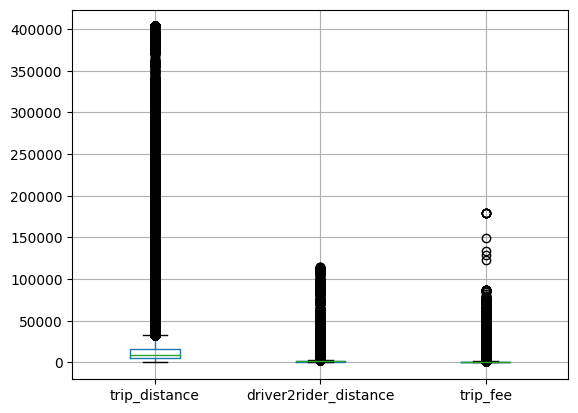

In [ ]:
boxplot = df.boxplot(column=['trip_distance', 'driver2rider_distance', 'trip_fee'])
# Outlier Detection using IQR
Q1 = df['trip_distance'].quantile(0.25)
Q3 = df['trip_distance'].quantile(0.75)
IQR = Q3-Q1

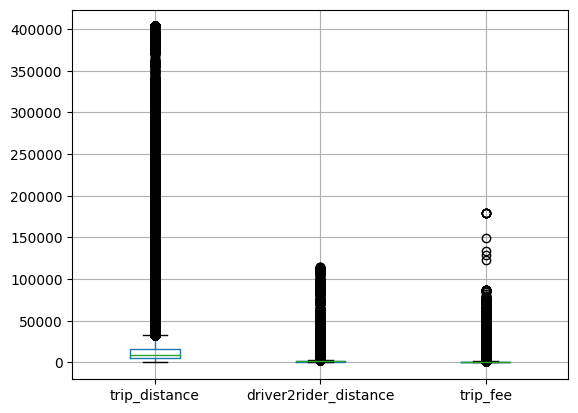

In [ ]:
df_remove_outliers = df[((df['trip_distance'] >= (Q1-1.5*IQR)) | (df['trip_distance'] <= (Q3+1.5*IQR)))]
boxplot = df_remove_outliers.boxplot(column=['trip_distance', 'driver2rider_distance', 'trip_fee'])


In [ ]:
#df['trip_fee'].describe()
#df['driver2rider_distance'].describe()
#df["trip_distance"].describe()



In [ ]:
df["rider_cancel_reason"].unique()

array([nan, 'UNDEFINED', 'UNREACHABLE', 'TEST', 'TOOK_OTHER_TRANSPORT',
       'OTHER', 'DASHBOARD_CANCEL_REASON'], dtype=object)

In [ ]:
ds.isnull().sum()

##Correaltion map

In [ ]:
def plot_correlation_map(df):
    corr = df.corr()
    s , ax = plt.subplots( figsize =( 12 , 10 ) )
    cmap = sns.diverging_palette( 220 , 10 , as_cmap = True )
    s = sns.heatmap(
        corr,
        cmap = cmap,
        square=True,
        cbar_kws={ 'shrink' : .9 },
        ax=ax,
        annot = True,
        annot_kws = { 'fontsize' : 12 }
      )

In [ ]:
#df.corr()

plot_correlation_map(df)
#df.drop("Unnamed: 0", axis=1,inplace= True )

##train,test

###label-encoding pickup and destination

In [ ]:

from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder


In [ ]:
enc= LabelEncoder()

In [ ]:
df["pickup_city"]=enc.fit_transform(df["pickup_city"])
df["destination_city"]=enc.fit_transform(df["destination_city"])
df["duration"] = enc.fit_transform(df["duration"])
df["day_week"] = enc.fit_transform(df["day_week"])
df["time_day"] = enc.fit_transform(df["time_day"])








In [ ]:
#X = df[["driver2rider_distance" , "trip_distance" , "pickup_city" , "destination_city" ,"duration" ]]
#X = df[["driver2rider_distance" , "trip_distance" , "pickup_city" , "destination_city"  ]]
#X = df[["trip_distance" ]]
#X = df[["driver2rider_distance" , "trip_distance" , "pickup_city" , "destination_city" , "duration" , "day_week","time_day" ]]
#X = df[["driver2rider_distance" , "trip_distance" , "pickup_city" , "destination_city" , "duration" ]]
X = df[["trip_distance" , "driver2rider_distance" ]]
#X = df[["trip_distance" ]]
#X = df_fini[["trip_distance" , ""]]
#X = df[["driver2rider_distance" , "trip_distance" ]]

Y = df["trip_fee"]

In [ ]:
#X_test = ds[["driver2rider_distance" , "trip_distance"]]
#Y_test = ds["trip_fee"]

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X,Y , test_size=0.33, random_state=42)


In [ ]:
import pandas as pd

# Supposons que df_map soit un DataFrame Pandas contenant la variable trip_distance

# Calcul des quantiles
quantiles_td = df['trip_distance'].quantile([0.01, 0.995])

# Winsorization pour la variable trip_distance
df['trip_distance'] = df['trip_distance'].clip(lower=quantiles_td.iloc[0], upper=quantiles_td.iloc[1])


###label_encoding test

In [ ]:
test_data["pickup_city"]=enc.fit_transform(test_data["pickup_city"])
test_data["destination_city"]=enc.fit_transform(test_data["destination_city"])
test_data["duration"] = enc.fit_transform(test_data["duration"])
test_data["day_week"] = enc.fit_transform(test_data["day_week"])
test_data["time_day"] = enc.fit_transform(test_data["time_day"])





##model2 XG_BOOST

In [ ]:
import numpy as np
import pandas as pd
from sklearn import preprocessing
import xgboost as xgb
from xgboost.sklearn import XGBRegressor
import datetime
from sklearn.model_selection import GridSearchCV

In [ ]:
xgb1 = XGBRegressor()
parameters = {'nthread':[4],
              'objective':['reg:linear'],
              'learning_rate': [.03, 0.05, .07],
              'max_depth': [5, 6, 7],
              'min_child_weight': [4],
              'silent': [1],
              'subsample': [0.7],
              'colsample_bytree': [0.7],
              'n_estimators': [500]}

xgb_grid = GridSearchCV(xgb1,
                        parameters,
                        cv = 2,
                        n_jobs = 5,
                        verbose=True)



In [ ]:
xgb_grid.fit(X_train,Y_train)

print(xgb_grid.best_score_)
print(xgb_grid.best_params_)

Fitting 2 folds for each of 9 candidates, totalling 18 fits


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [10:11:23] WARNING: /workspace/src/objective/regression_obj.cu:209: reg:linear is now deprecated in favor of reg:squarederror.
  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [10:11:23] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "silent" } are not used.

  warnings.warn(smsg, UserWarning)


0.7488673651429245
{'colsample_bytree': 0.7, 'learning_rate': 0.07, 'max_depth': 5, 'min_child_weight': 4, 'n_estimators': 500, 'nthread': 4, 'objective': 'reg:linear', 'silent': 1, 'subsample': 0.7}


In [ ]:
# Initialiser le modèle
model_2 = xgb.XGBRegressor()
#iteration , #alpha ,#

In [ ]:
# Entraîner le modèle
model_2.fit(X_train, Y_train)

In [ ]:
# Prédire les valeurs sur l'ensemble de test
y_pred = model_2.predict(X_test)

In [ ]:
print(y_pred)

[ 388.6521  1006.1564   339.54752 ...  476.8016  1814.1619   301.9293 ]


In [ ]:
import numpy as np
mse = mean_squared_error(Y_test, y_pred)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)
#print(mse)

Root Mean Squared Error (RMSE): 1303.7120714246537


##model1 : linear Regressions

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LinearRegression

In [ ]:
#X = df[["trip_distance" , "trip_status"]]


In [ ]:
# Initialiser le modèle et l'entraîner
model = LinearRegression()
model.fit(X_train, Y_train)

In [ ]:
y_pred = model.predict(X_test)
print(y_pred)  # Affiche les valeurs prédites

In [ ]:
mse = mean_squared_error(Y_test, y_pred)
rmse = np.sqrt(mse)
#r2 = r2_score(Y_test, y_pred)

#print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
#print("R-squared (R2) Score:", r2)

NameError: name 'y_pred' is not defined

In [ ]:
#y_pred_sur_test = model.predict(dt)

##model3

In [ ]:

# Initialiser le modèle
model_3 = SVR( )



In [ ]:
# Entraîner le modèle
model_3.fit(X_train, Y_train)



In [ ]:
# Prédire les valeurs sur l'ensemble de test
y_pred = model_3.predict(X_test)



In [ ]:
mse = mean_squared_error(Y_test, y_pred)
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)

##model4

In [ ]:
from sklearn import linear_model
clf = linear_model.LinearRegression()
clf.fit(X_train, Y_train)


from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
X, y = make_regression(n_features=4, n_informative=2,random_state=0, shuffle=False)
regr = RandomForestRegressor(max_depth=2, random_state=0)
regr.fit(X, y)
RandomForestRegressor(...)


In [ ]:
y_pred = clf.predict(X_test)
print(y_pred)  # Affiche les valeurs prédites

In [ ]:
mse = mean_squared_error(Y_test, y_pred)
rmse = np.sqrt(mse)
#r2 = r2_score(Y_test, y_pred)

#print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
#print("R-squared (R2) Score:", r2)

##model5

In [ ]:
from sklearn.linear_model import Ridge, Lasso

# For Ridge Regression
ridge_model = Ridge(alpha=1.0)  # Adjust alpha as needed
ridge_model.fit(X_train, Y_train)




Ridge()

In [ ]:
y_pred = model_6.predict(X_test)
print(y_pred)  # Affiche les valeurs prédites

[ 331.80031012 1081.59227586  330.91801417 ...  667.92844478  270.93658256
  488.33217495]


In [ ]:
mse = mean_squared_error(Y_test, y_pred)
rmse = np.sqrt(mse)
#r2 = r2_score(Y_test, y_pred)

#print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
#print("R-squared (R2) Score:", r2)

Root Mean Squared Error (RMSE): 752.9983830509447


##model6

In [ ]:
from sklearn.linear_model import BayesianRidge

model_6 = BayesianRidge()
model_6.fit(X_train, Y_train)


BayesianRidge()

##model7 ;-

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression


random_forest_regressor=RandomForestRegressor()
random_forest_regressor.fit(X_train,Y_train)


##submission

In [ ]:
sub = pd.read_csv("/content/sample_submission.csv")
sub

,id,trip_fee
0,N7aPBXp0Flm5,0
1,tOwj3FIL1IzN,0
2,DPHis6MSuc2R,0
3,uJTNO4TrLHMV,0
4,jpyQzGklCqrU,0
...,...,...
276464,jmTTm25K3RVL,0
276465,3uw4DIshv6Mq,0
276466,YKBd0m9ileHK,0
276467,rFOqiDcjHGGX,0


In [ ]:
test_data = pd.read_csv("/content/test.csv")
test_data.head()

,id,request_date,pickup_city,destination_city,accepted_date,started_date,rider,driver,trip_distance,driver2rider_distance,used_discount,trip_status,trip_finished_date,rider_rating,driver_rating,rider_cancel_reason,driver_cancel_reason,discount_amount
0,N7aPBXp0Flm5,2021-06-27 08:52:14.396,Alger,Alger,2021-06-27 08:53:06.243,NaN,EIdLWfrGHFCa,6VwbRFt8nlkk,305,85,0,NOT_FINISHED,NaN,NaN,NaN,NaN,NaN,NaN
1,tOwj3FIL1IzN,2021-06-07 14:17:31.774,Alger,Alger,2021-06-07 14:18:18.363,2021-06-07 14:29:24.456,QFi4jOwMNjPr,eYnWva0Z38su,19812,1670,0,FINISHED,2021-06-07 14:50:46.282,5.0,5.0,NaN,NaN,NaN
2,DPHis6MSuc2R,2021-06-10 12:26:58.441,Alger,Alger,2021-06-10 12:30:59.679,NaN,EjU9WldJx4YE,MhxlpBF3aXEa,6413,988,1,NOT_FINISHED,NaN,NaN,NaN,NaN,NaN,500.0
3,uJTNO4TrLHMV,2021-06-22 07:49:42.712,Tipaza,Alger,NaN,NaN,0Frx3EFp91pw,yOf6NbYVTVAl,25698,1457,1,NOT_FINISHED,NaN,NaN,NaN,NaN,NaN,9999.0
4,jpyQzGklCqrU,2021-06-10 11:04:24.347,Alger,Alger,NaN,NaN,GpQb0nV4AnyV,yOf6NbYVTVAl,8518,1128,1,NOT_FINISHED,NaN,NaN,NaN,NaN,NaN,500.0


In [ ]:
# Check the features in the training data
print(model.feature_names_in_)

# Check the features in the test data
print(test_data.columns)

In [ ]:
#test_data["trip_status"] = enc.fit_transform(test_data["trip_status"])



In [ ]:
#y_pred_test= model.predict(test_data[["driver2rider_distance" , "trip_distance" ,"pickup_city" ,"destination_city" ,"duration" , "day_week" , "time_day"]])
#y_pred_test = model.predict(test_data[["driver2rider_distance" , "trip_distance" , "pickup_city" , "destination_city" , "duration" , "day_week","time_day" ]])
#X = df[["driver2rider_distance" , "trip_distance" , "pickup_city" , "destination_city" , "duration" , "day_week","time_day" ]]

#y_pred_test_2 = model.predict(test_data[["driver2rider_distance" , "trip_distance" ,"pickup_city" ,"destination_city" ,"duration" , "day_week" , "time_day"]])
#y_pred_5 = ridge_model.predict(test_data[["driver2rider_distance" , "trip_distance" ,"pickup_city" ,"destination_city" ,"duration" , "day_week"]])

#y_pred_test= model.predict(test_data[[  "trip_distance" , "trip_status"]])
#y_pred_test_2 = model_2.predict(test_data[["driver2rider_distance" , "trip_distance" ,"pickup_city" ,"destination_city" ,"duration"]])
#y_pred_test_2 = model.predict(test_data[["driver2rider_distance" , "trip_distance" ,"pickup_city" ,"destination_city" ,"duration"]])
#y_pred_test_2 = model.predict(test_data[["driver2rider_distance" , "trip_distance" ,"pickup_city" ,"destination_city" ,"duration"]])
#y_pred_test_2 = model.predict(test_data[["driver2rider_distance" , "trip_distance" , "pickup_city" , "destination_city" , "duration" ]])




y_pred_test_2 = model.predict(test_data[[ "trip_distance" , "driver2rider_distance"  ]])

#X = df[["driver2rider_distance" , "trip_distance" ,"pickup_city" ,"destination_city"  ]]



In [ ]:
#y_pred_test_4= model.predict(test_data[[ "trip_distance" ]])


In [ ]:
#y_pred_test =model_2.predict(test_data[["driver2rider_distance" , "trip_distance" ,"pickup_city" ,"destination_city" ]])


In [ ]:
#sub_finis = sub[sub["trip_status"]=="FINISHED"]


In [ ]:
sub["trip_fee"]= y_pred_test_2

In [ ]:
sub

In [ ]:
file_path = '/content/submit_fgl.csv'
sub.to_csv(file_path, index=False)

##Carte Graphique

In [ ]:
import csv
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt


In [ ]:
df_train =  pd.read_csv('train.csv')
df_test =  pd.read_csv('test.csv')
df_submis = pd.read_csv('sample_submission.csv')

In [ ]:
import pandas as pd

# Créer une liste pour stocker les coordonnées
pickup_coords_list = []

# Parcourir les villes de pickup dans df_train et obtenir leurs coordonnées
for city in df_train["pickup_city"].unique():
    city_coords = get_coordinates(city + ", Algeria")
    if city_coords:
        pickup_coords_list.append({"pickup_city": city, "latitude": city_coords[0], "longitude": city_coords[1]})
    else:
        print(f"Coordonnées introuvables pour {city}")

# Créer un DataFrame à partir de la liste des coordonnées
df_pickup_coords = pd.DataFrame(pickup_coords_list)

# Afficher le DataFrame des coordonnées
print(df_pickup_coords)


            pickup_city   latitude  longitude
0           Constantine  36.364164   6.608428
1                 Alger  36.775361   3.060188
2                  Oran  35.704442  -0.650298
3                Béjaïa  36.751178   5.064369
4                Annaba  36.898216   7.754927
5                 Blida  36.470566   2.827494
6                 Batna  35.338429   5.731545
7            Tizi Ouzou  36.681618   4.237186
8                Tipaza  36.527157   2.167201
9             Boumerdès  36.735803   3.616305
10                Sétif  36.189585   5.402466
11               Skikda  36.754512   6.885625
12              Tlemcen  34.881789  -1.316699
13              El Oued  33.215441   7.155321
14                Chlef  36.203420   1.268070
15               Biskra  34.784564   5.812435
16              Ouargla  30.998015   6.766454
17               M'Sila  35.130021   4.200311
18                 Mila  36.250214   6.165216
19  Bordj Bou Arreridj‎  36.096203   4.660274
20            Aïn Defla  36.158684

In [ ]:
# Merge df_train with df_pickup_coords based on the 'pickup_city' column
df_merged = df_train.merge(df_pickup_coords, on='pickup_city', how='left')

# Display the merged DataFrame
print(df_merged)

                  id             request_date  pickup_city destination_city  \
0       LVwq2xeA5mMt   2021-01-30 14:06:19.94  Constantine      Constantine   
1       U9CuIIRyArx0  2021-05-18 07:54:39.922        Alger            Alger   
2       ke1gwcPZ93Nl  2021-03-05 13:17:24.999         Oran             Oran   
3       djk2iJ9DxEsC  2021-02-24 14:08:57.592        Alger            Alger   
4       FmVbgMcD4a5r  2021-03-08 09:14:24.922        Alger            Alger   
...              ...                      ...          ...              ...   
723401  J6DlD8LlKuyk   2021-03-08 12:31:20.06        Alger            Alger   
723402  WMIqrgn6LaPf   2021-01-12 14:51:24.67        Alger            Alger   
723403  bR0QC0MG2Mmr  2021-03-10 09:30:44.745        Alger            Alger   
723404  hStUZglOY79I  2021-02-11 07:48:25.722        Alger            Alger   
723405  JXbbPrvQB1R0  2021-04-25 20:02:12.889        Batna            Batna   

                  accepted_date             started

In [ ]:
df_merged

,id,request_date,pickup_city,destination_city,accepted_date,started_date,rider,driver,trip_distance,driver2rider_distance,...,trip_status,trip_finished_date,rider_rating,driver_rating,rider_cancel_reason,driver_cancel_reason,discount_amount,trip_fee,latitude,longitude
0,LVwq2xeA5mMt,2021-01-30 14:06:19.94,Constantine,Constantine,2021-01-30 14:07:04.707,NaN,E1B3rg1jOiBF,DVwusPupJeU4,16035,1927,...,NOT_FINISHED,NaN,NaN,NaN,NaN,NaN,NaN,511,36.364164,6.608428
1,U9CuIIRyArx0,2021-05-18 07:54:39.922,Alger,Alger,2021-05-18 07:55:05.362,2021-05-18 08:03:23.664,u7zilHWibXpk,Mv2dXvQt5e5i,12031,1884,...,FINISHED,2021-05-18 08:32:03.611,4.0,5.0,NaN,NaN,NaN,579,36.775361,3.060188
2,ke1gwcPZ93Nl,2021-03-05 13:17:24.999,Oran,Oran,NaN,NaN,NmumknIUfHYy,yOf6NbYVTVAl,16812,994,...,NOT_FINISHED,NaN,NaN,NaN,NaN,NaN,NaN,706,35.704442,-0.650298
3,djk2iJ9DxEsC,2021-02-24 14:08:57.592,Alger,Alger,2021-02-24 14:09:35.139,2021-02-24 14:15:15.67,lM2VjdqUB1Eb,L0b1fBxbKELj,6759,1037,...,FINISHED,2021-02-24 14:19:18.31,5.0,5.0,NaN,NaN,NaN,343,36.775361,3.060188
4,FmVbgMcD4a5r,2021-03-08 09:14:24.922,Alger,Alger,2021-03-08 09:14:58.244,2021-03-08 09:49:02.868,xe9ExnoJcI9a,VNJpNZpa9A1Q,11628,1174,...,FINISHED,2021-03-08 09:49:04.071,5.0,5.0,UNDEFINED,UNDEFINED,500.0,517,36.775361,3.060188
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
723401,J6DlD8LlKuyk,2021-03-08 12:31:20.06,Alger,Alger,NaN,NaN,1NN9IlQ87wWN,yOf6NbYVTVAl,15535,2227,...,NOT_FINISHED,NaN,NaN,NaN,NaN,NaN,NaN,714,36.775361,3.060188
723402,WMIqrgn6LaPf,2021-01-12 14:51:24.67,Alger,Alger,2021-01-12 14:52:23.756,2021-01-12 15:09:46.859,T50lRf8zPnvy,a7MiKNRXGjZp,11023,940,...,FINISHED,2021-01-12 15:09:48.569,5.0,4.0,NaN,NaN,NaN,418,36.775361,3.060188
723403,bR0QC0MG2Mmr,2021-03-10 09:30:44.745,Alger,Alger,2021-03-10 09:32:15.915,2021-03-10 09:56:32.52,TOwqRk6ppWv8,Ro2T1UPf92u1,2736,410,...,FINISHED,2021-03-10 09:56:33.988,2.0,5.0,NaN,NaN,NaN,250,36.775361,3.060188
723404,hStUZglOY79I,2021-02-11 07:48:25.722,Alger,Alger,2021-02-11 07:49:35.707,2021-02-11 07:54:33.542,XyCbvjSr7Tbr,7koHXKMSBb3m,10560,1123,...,FINISHED,2021-02-11 08:09:04.654,5.0,5.0,NaN,NaN,NaN,416,36.775361,3.060188


In [ ]:
!pip install basemap


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 936.0/936.0 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 30.5/30.5 MB 26.8 MB/s eta 0:00:00


In [ ]:
import folium
from folium.plugins import HeatMap

# Calculate the center of the map based on mean latitude and longitude
center_lat = df_merged['latitude'].mean()
center_lon = df_merged['longitude'].mean()

# Create a map centered around the mean latitude and longitude
map_algeria = folium.Map(location=[center_lat, center_lon], zoom_start=5)

# Convert latitude and longitude to list of lists
heat_data = df_merged[['latitude', 'longitude']].values.tolist()

# Add heatmap layer to the map
HeatMap(heat_data).add_to(map_algeria)

# Display the map
map_algeria


In [ ]:
df_merged.dropna(subset=['latitude', 'longitude'], inplace=True)

# Créer une carte interactive avec folium
m = folium.Map(location=[df_merged['latitude'].mean(), df_merged['longitude'].mean()], zoom_start=10)

# Ajouter des marqueurs pour chaque zone géographique où les annulations ont eu lieu
for index, row in df_merged.iterrows():
    # Créer un marqueur pour chaque annulation avec le motif d'annulation comme popup
    popup_text = f"Motif d'annulation passager : {row['rider_cancel_reason']} <br> Motif d'annulation conducteur : {row['driver_cancel_reason']}"
    folium.Marker(location=[row['latitude'], row['longitude']], popup=popup_text).add_to(m)

m